In [1]:
import sys
sys.path.append("./utls")
from preprocessing import *

alphabet = list(string.ascii_lowercase)

project_name = ["MuSIC", "MaPS", "MuSIC_EXP1"]
if os.name == "posix":
    data_dir = subprocess.getoutput("echo $DATADIR")
elif os.name == "nt":
    data_dir = subprocess.getoutput("echo %datadir%")
music_dir = os.path.join(data_dir, "MuSIC")
if not os.path.exists(music_dir):
    project_name[0] = "2024-MUSIC"
daq_dir = os.path.join(data_dir, *project_name, "Acoustic Monitoring")
lmq_dir = os.path.join(data_dir, *project_name, "LMQ Monitoring")
del music_dir

sampling_rate_daq: int = int(1.25 * 1e6)
sampling_rate_lmq: int = int(0.1 * 1e6)
tdms_daq_list = natsorted(
    [i for i in os.listdir(daq_dir) if i.split(".")[-1] == "tdms"]
)
bin_lmq_list = natsorted([i for i in os.listdir(lmq_dir) if i.split(".")[-1] == "bin"])
lmq_channel_name = [
    "Vector ID",
    "meltpooldiode",
    "X Coordinate",
    "Y Coordinate",
    "Laser power",
    "Spare",
    "Laser diode",
    "Varioscan(focal length)",
]

## Meta Data
### Monitoring Setup
- Acoustic monitoring @ 1.25 MHz
    - Microphone(AI0) – with ext. amplifier gain 10 ADC 5
    - Structure-borne AE (AI1)– ADC range 5
    - Photodiode(AI2) – ADC 10
- LMQ monitoring @ 100 kHz
    - Channel 1 – Vactor ID
    - Channel 2 – Melt pool diode
    - Channel 3 – X coord represented in bits, use bits to um calibration (3,40976 bit/um)
    - Channel 4 – Y coord represented in bits, use bits to um calibration ( 3,376 bit/um)
    - Channel 5 – nominal laser power
    - Channel 6 – Spare
    - Channel 7 – Laser diode
    - Channel 8 – Varioscan ( for focal length , constant in our case)

### DAQ

In [2]:
seedir.seedir(daq_dir)

Acoustic Monitoring/
├─2024-07-16-16-27-34-MuSIC_EXP1 _Layer_100_0.tdms
├─2024-07-16-16-27-34-MuSIC_EXP1 _Layer_100_0.tdms_index
├─2024-07-16-16-27-34-MuSIC_EXP1 _Layer_101_0.tdms
├─2024-07-16-16-27-34-MuSIC_EXP1 _Layer_101_0.tdms_index
├─2024-07-16-16-27-34-MuSIC_EXP1 _Layer_102_0.tdms
├─2024-07-16-16-27-34-MuSIC_EXP1 _Layer_102_0.tdms_index
├─2024-07-16-16-27-34-MuSIC_EXP1 _Layer_103_0.tdms
├─2024-07-16-16-27-34-MuSIC_EXP1 _Layer_103_0.tdms_index
├─2024-07-16-16-27-34-MuSIC_EXP1 _Layer_104_0.tdms
├─2024-07-16-16-27-34-MuSIC_EXP1 _Layer_104_0.tdms_index
├─2024-07-16-16-27-34-MuSIC_EXP1 _Layer_105_0.tdms
├─2024-07-16-16-27-34-MuSIC_EXP1 _Layer_105_0.tdms_index
├─2024-07-16-16-27-34-MuSIC_EXP1 _Layer_106_0.tdms
├─2024-07-16-16-27-34-MuSIC_EXP1 _Layer_106_0.tdms_index
├─2024-07-16-16-27-34-MuSIC_EXP1 _Layer_107_0.tdms
├─2024-07-16-16-27-34-MuSIC_EXP1 _Layer_107_0.tdms_index
├─2024-07-16-16-27-34-MuSIC_EXP1 _Layer_108_0.tdms
├─2024-07-16-16-27-34-MuSIC_EXP1 _Layer_108_0.tdms_index
├─2024-

In [3]:
file_path =os.path.join(daq_dir,tdms_daq_list[0])
_tdms_name = "".join((os.path.split(file_path)[-1].split(".")[0]).split("_")[-3:-1])
print_tdms_structure(file_path)
tdms_daq = TdmsFile(file_path)
_mic = (tdms_daq.groups()[0]).channels()[0].data
_ae = (tdms_daq.groups()[0]).channels()[1].data
_photodiode = (tdms_daq.groups()[0]).channels()[2].data
_t=np.linspace(0,len(_mic)/sampling_rate_daq,len(_mic))

2024-07-16-16-27-34-MuSIC_EXP1 _Layer_1_0
├── Common
│   ├── PXI1Slot4/ai0
│   │   ├── wf_start_time: 2024-07-16T15:26:32.065705
│   │   ├── wf_start_offset: 0.0
│   │   ├── wf_increment: 7.999999992549015e-07
│   │   ├── wf_samples: 100000
│   │   ├── NI_ChannelName: PXI1Slot4/ai0
│   │   ├── NI_UnitDescription: Volts
│   │   ├── unit_string: Volts
│   ├── PXI1Slot4/ai1
│   │   ├── wf_start_time: 2024-07-16T15:26:32.065705
│   │   ├── wf_start_offset: 0.0
│   │   ├── wf_increment: 7.999999992549015e-07
│   │   ├── wf_samples: 100000
│   │   ├── NI_ChannelName: PXI1Slot4/ai1
│   │   ├── NI_UnitDescription: Volts
│   │   ├── unit_string: Volts
│   ├── PXI1Slot4/ai2
│   │   ├── wf_start_time: 2024-07-16T15:26:32.065705
│   │   ├── wf_start_offset: 0.0
│   │   ├── wf_increment: 7.999999992549015e-07
│   │   ├── wf_samples: 100000
│   │   ├── NI_ChannelName: PXI1Slot4/ai2
│   │   ├── NI_UnitDescription: Volts
│   │   ├── unit_string: Volts
└── File Property name: 2024-07-16-16-27-34-MuSIC_

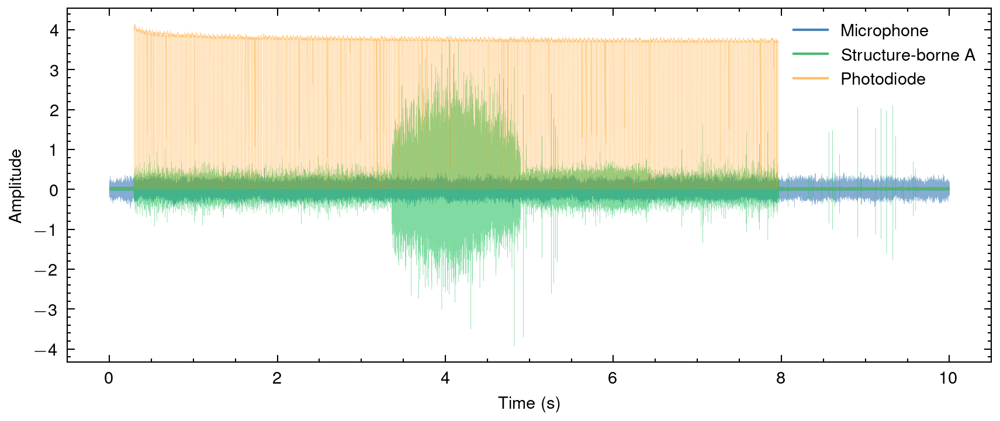

In [5]:
lw=0.1
alpha=0.5
fig,ax = plt.subplots(figsize=(6.8,2.625))
ax.plot(_t,_mic,alpha=alpha,lw=lw,label='Microphone',color=cm_std[0])
ax.plot(_t,_ae*2,alpha=alpha,lw=lw,label='Structure-borne AE',color=cm_std[1])
ax.plot(_t,_photodiode,alpha=alpha,lw=lw,label='Photodiode',color=cm_std[2])
ax.set_ylabel(f"Amplitude")
ax.set_xlabel(f"Time (s)")
legend_elements = [
    plt.Line2D([], [], label='Microphone', color="#4984B8", linestyle='-'),
    plt.Line2D([], [], label='Structure-borne A', color='#49B873', linestyle='-'),
    plt.Line2D([], [], label='Photodiode', color="#FFBF65", linestyle='-'),
]
plt.legend(handles=legend_elements)
plt.savefig(f"./outputs/raw_daq_{_tdms_name}.png",dpi=300)
plt.show()

### LMQ

In [6]:
seedir.seedir(lmq_dir)

LMQ Monitoring/
├─layer1.bin
├─layer10.bin
├─layer100.bin
├─layer101.bin
├─layer102.bin
├─layer103.bin
├─layer104.bin
├─layer105.bin
├─layer106.bin
├─layer107.bin
├─layer108.bin
├─layer109.bin
├─layer11.bin
├─layer110.bin
├─layer111.bin
├─layer112.bin
├─layer113.bin
├─layer114.bin
├─layer115.bin
├─layer116.bin
├─layer117.bin
├─layer118.bin
├─layer119.bin
├─layer12.bin
├─layer120.bin
├─layer121.bin
├─layer122.bin
├─layer123.bin
├─layer124.bin
├─layer125.bin
├─layer126.bin
├─layer127.bin
├─layer128.bin
├─layer129.bin
├─layer13.bin
├─layer130.bin
├─layer131.bin
├─layer132.bin
├─layer133.bin
├─layer134.bin
├─layer135.bin
├─layer136.bin
├─layer137.bin
├─layer138.bin
├─layer139.bin
├─layer14.bin
├─layer140.bin
├─layer141.bin
├─layer142.bin
├─layer143.bin
├─layer144.bin
├─layer145.bin
├─layer146.bin
├─layer147.bin
├─layer148.bin
├─layer149.bin
├─layer15.bin
├─layer150.bin
├─layer151.bin
├─layer152.bin
├─layer153.bin
├─layer154.bin
├─layer155.bin
├─layer156.bin
├─layer157.bin
├─layer158.bin
├─

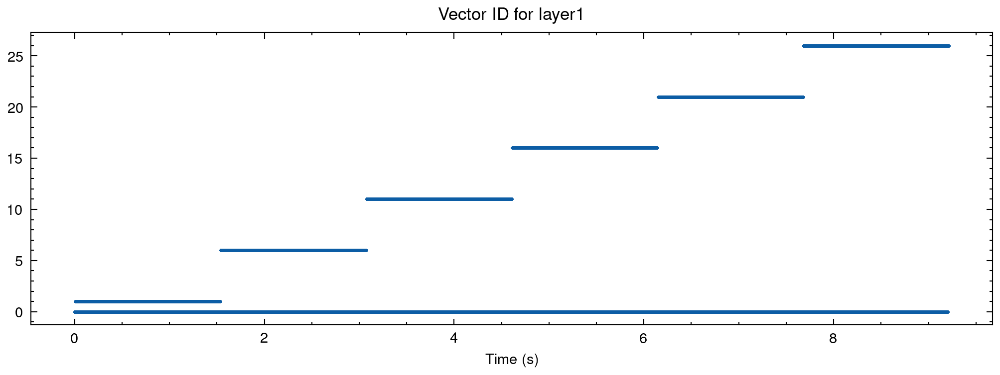

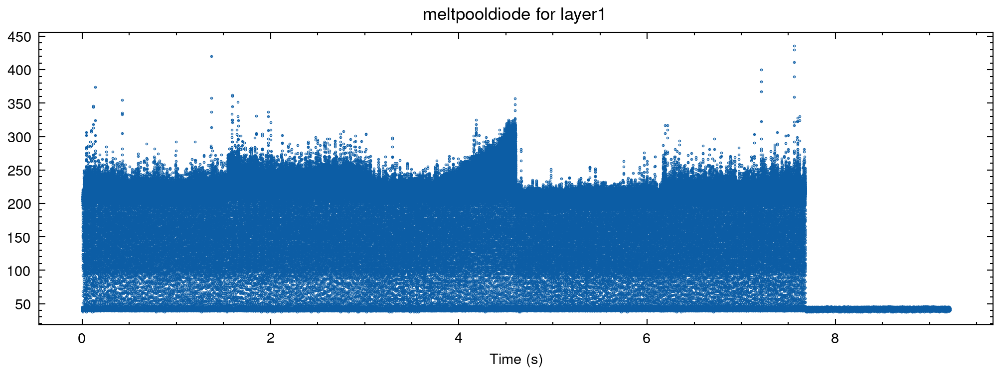

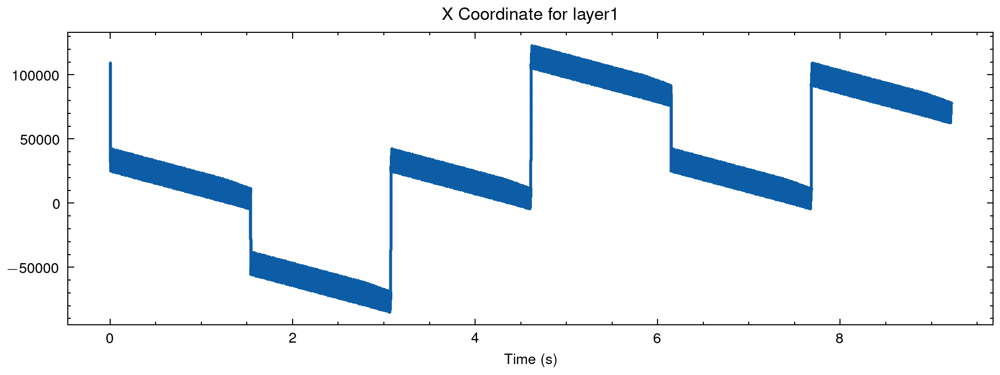

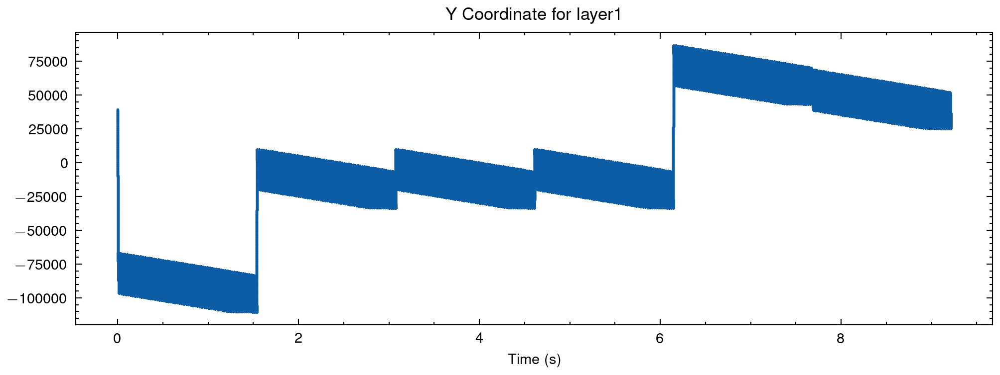

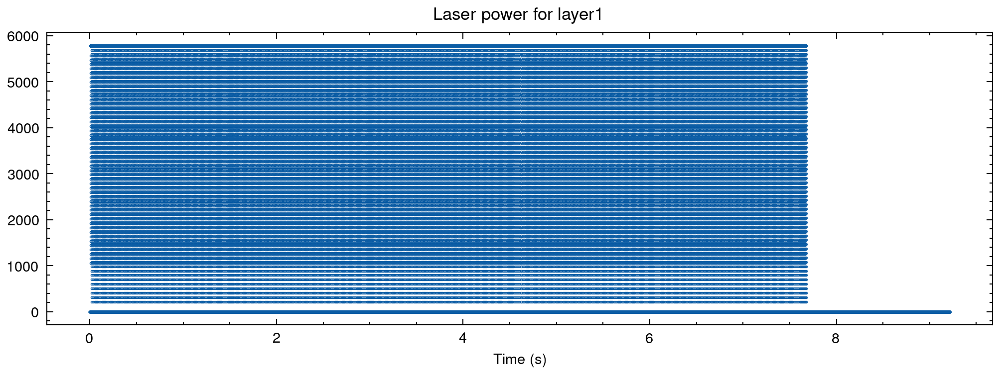

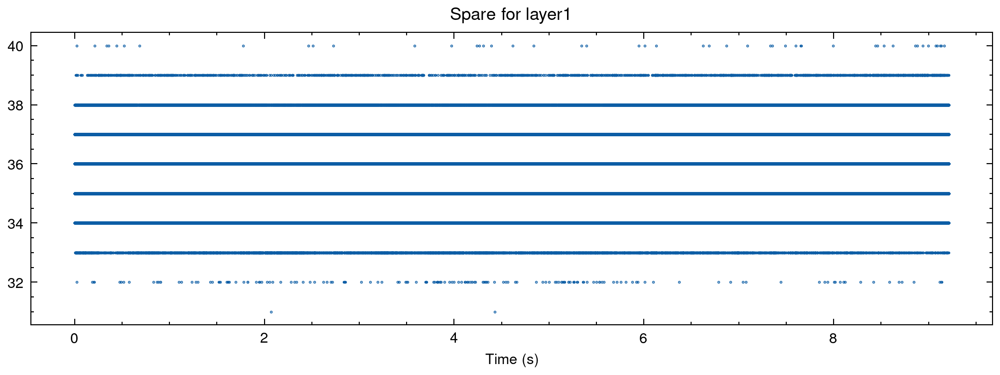

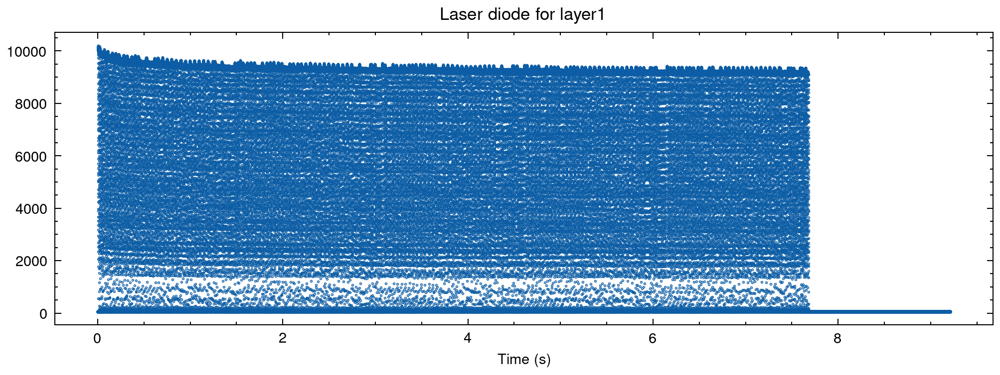

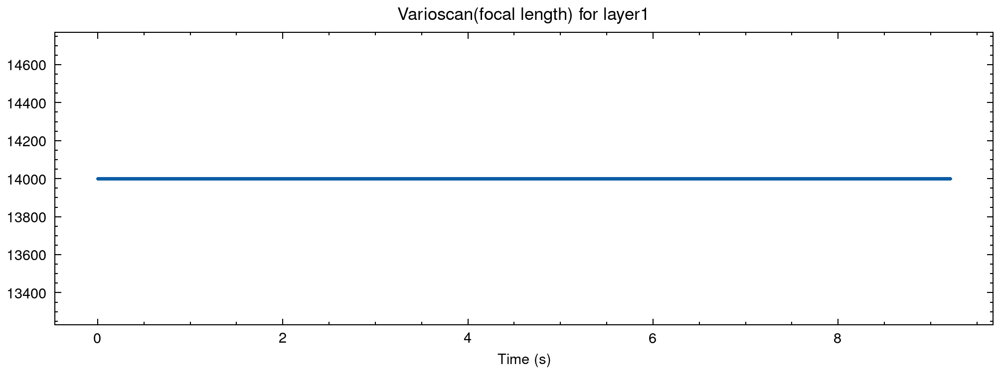

In [7]:
file_path = os.path.join(lmq_dir,bin_lmq_list[0])
bin_lmq = read_bin_file(file_path)
_bin_name = os.path.split(file_path)[-1].split(".")[0]
_x=np.linspace(0,bin_lmq.shape[0]/sampling_rate_lmq,bin_lmq.shape[0])
for i,j in enumerate(lmq_channel_name):
    fig,ax = plt.subplots(figsize=(6.8,2.625))
    _y = bin_lmq[:,i]
    ax.scatter(_x, _y,s=0.1,color=cm_std[0])
    ax.set_xlabel("Time (s)")
    plt.title(f"{j} for {_bin_name}")
    plt.tight_layout()
    plt.savefig(f"./outputs/raw_lmq_{_bin_name}_{j}.png",dpi=300)
    plt.show()

# Archives

In [ ]:
file_name_list = ['test2','test3','test4','test5','test6','test7','test1','carrier1','carrier2','carrier3','gas','gas2','exhaust','idle']
laser_power_list = [10,11,7,5,10,10,0,0,0,0,0,0,0,0]
powder_feed_list = [85,100,100,100,85,200,0,100,85,100,0,0,0,0]
speed_list = [0.6,0.7,1,1.5,0.6,1,0.6,0,0,0,0,0,0,0]
carrier_list = [12,12,12,12,5,12,12,12,5,12,0,0,0,0]
shielding_list = [30,30,30,30,10,30,30,30,10,30,30,10,0,0]
rod_list = [1,1,2,2,3,3,1,3,3,3,3,3,3,1]
exhaust_on_list = [1,1,1,1,1,1,1,1,1,1,1,1,1,0]
# idle_list = [0,0,0,0,0,0,0,0,0,0,0,0,0]
contextDF = lists_to_dataframe(file_name_list,laser_power_list,powder_feed_list,speed_list,carrier_list,shielding_list,rod_list,exhaust_on_list)
contextDF.columns = ['Laser power','Powder feed','Speed','Carrier','Shielding','Rod number','Exhaust on']
contextDF

DataFrame created successfully.


,Laser power,Powder feed,Speed,Carrier,Shielding,Rod number,Exhaust on
test2,10.0,85.0,0.6,12.0,30.0,1.0,1.0
test3,11.0,100.0,0.7,12.0,30.0,1.0,1.0
test4,7.0,100.0,1.0,12.0,30.0,2.0,1.0
test5,5.0,100.0,1.5,12.0,30.0,2.0,1.0
test6,10.0,85.0,0.6,5.0,10.0,3.0,1.0
test7,10.0,200.0,1.0,12.0,30.0,3.0,1.0
test1,0.0,0.0,0.6,12.0,30.0,1.0,1.0
carrier1,0.0,100.0,0.0,12.0,30.0,3.0,1.0
carrier2,0.0,85.0,0.0,5.0,10.0,3.0,1.0
carrier3,0.0,100.0,0.0,12.0,30.0,3.0,1.0


### Inspect the power

  0%|          | 0/13 [00:00<?, ?it/s]

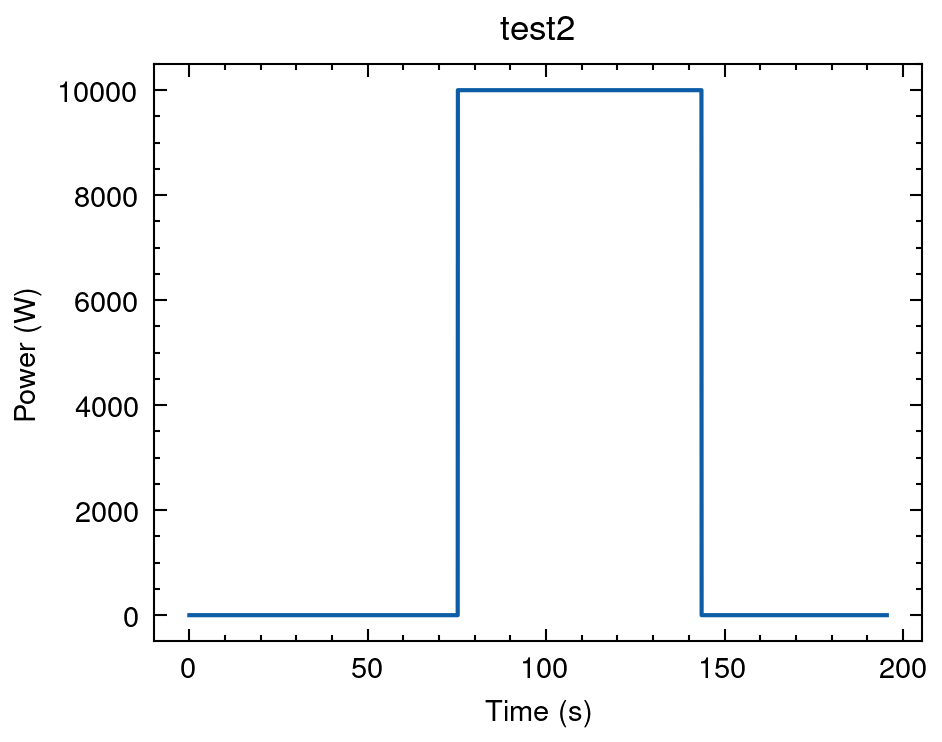

  8%|▊         | 1/13 [00:00<00:05,  2.07it/s]

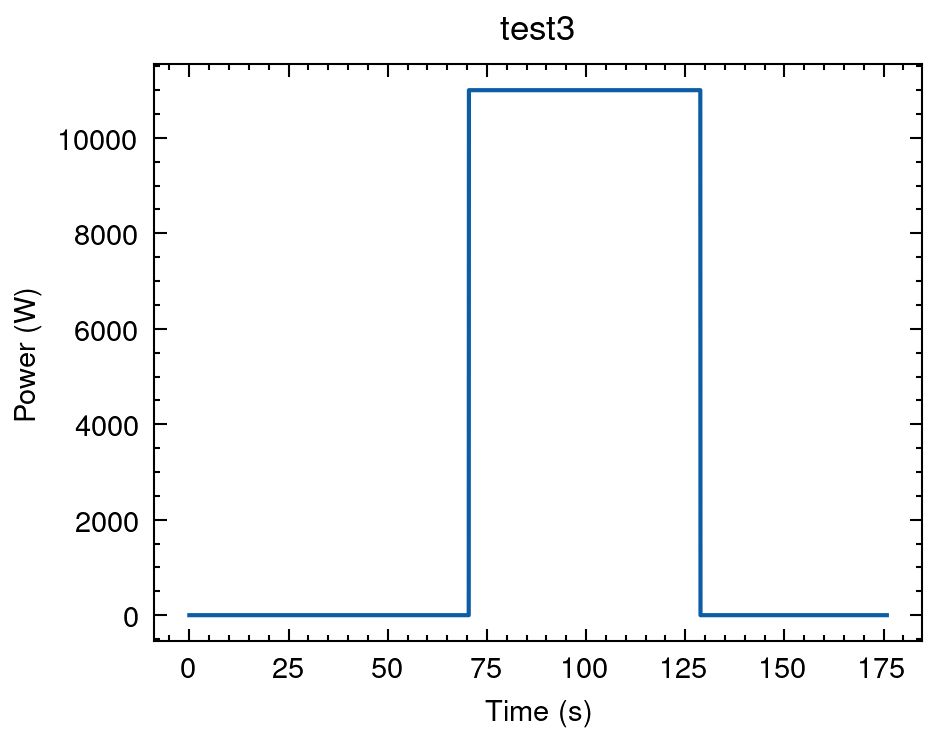

 15%|█▌        | 2/13 [00:00<00:05,  2.15it/s]

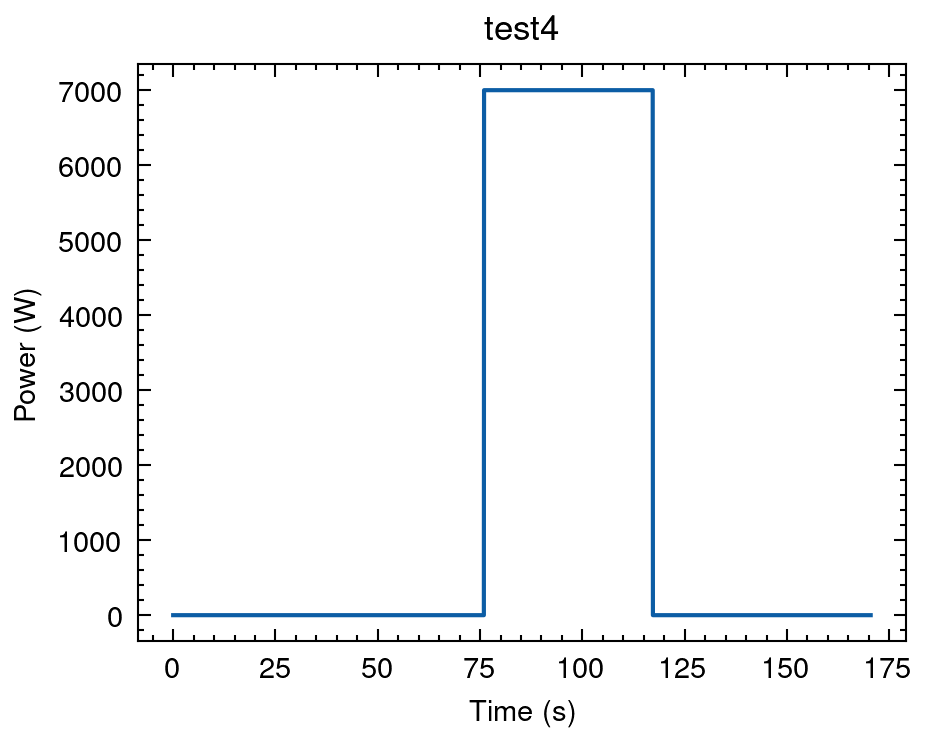

 23%|██▎       | 3/13 [00:01<00:04,  2.07it/s]

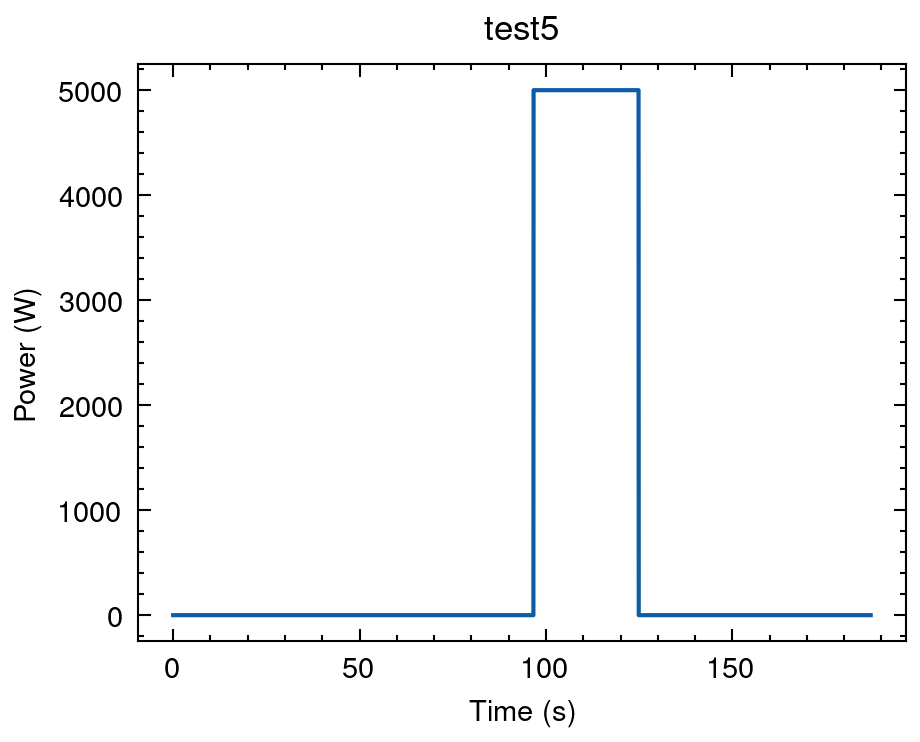

 31%|███       | 4/13 [00:01<00:04,  2.14it/s]

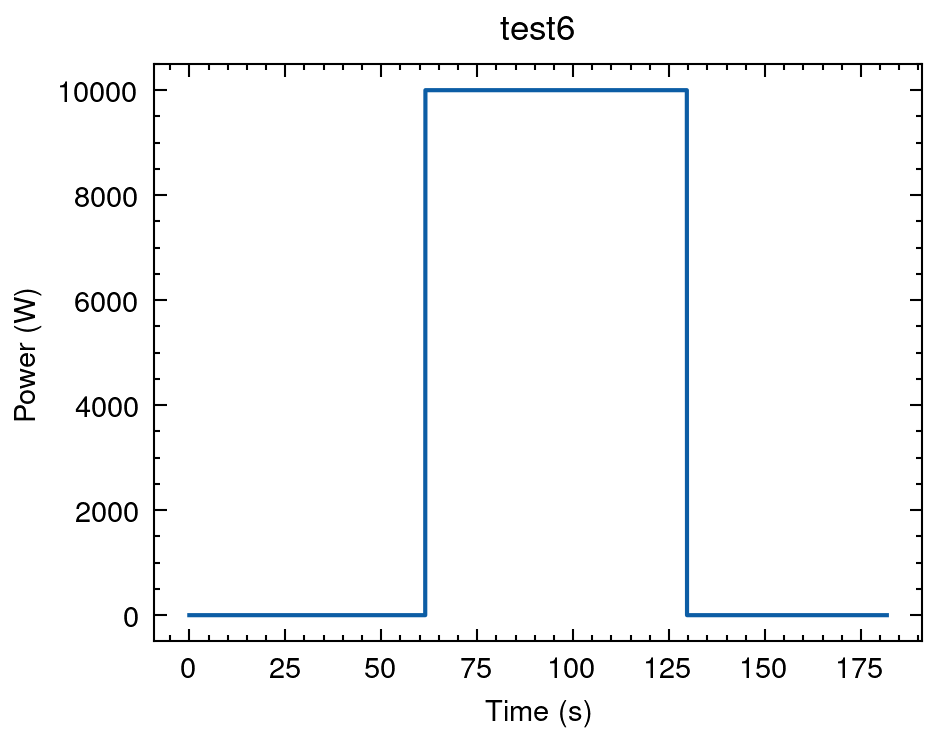

 38%|███▊      | 5/13 [00:02<00:03,  2.17it/s]

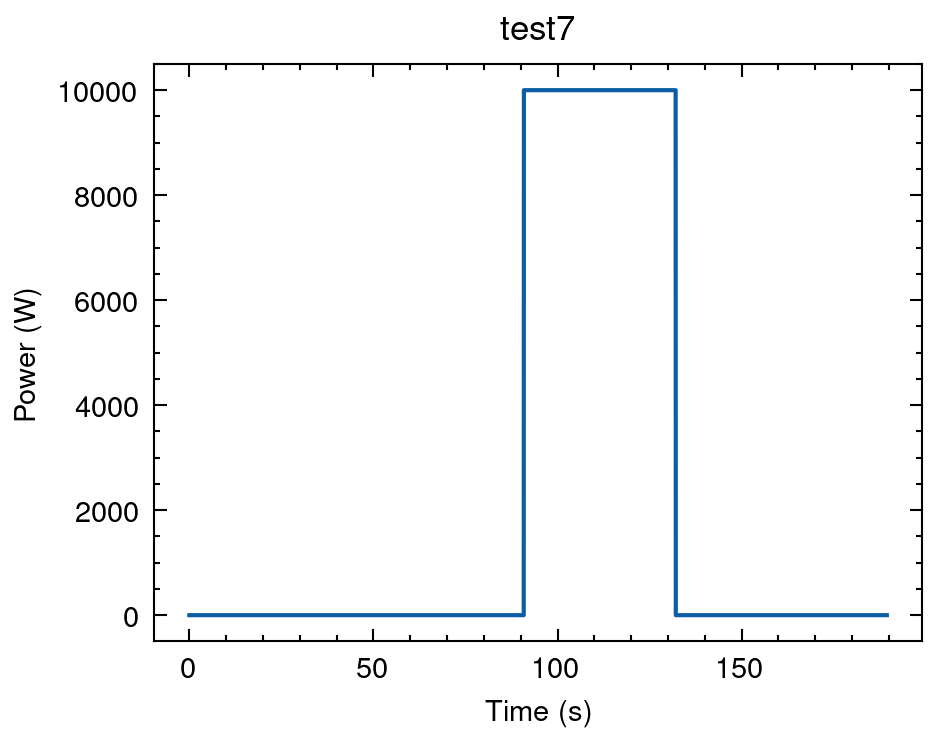

 46%|████▌     | 6/13 [00:03<00:03,  1.80it/s]

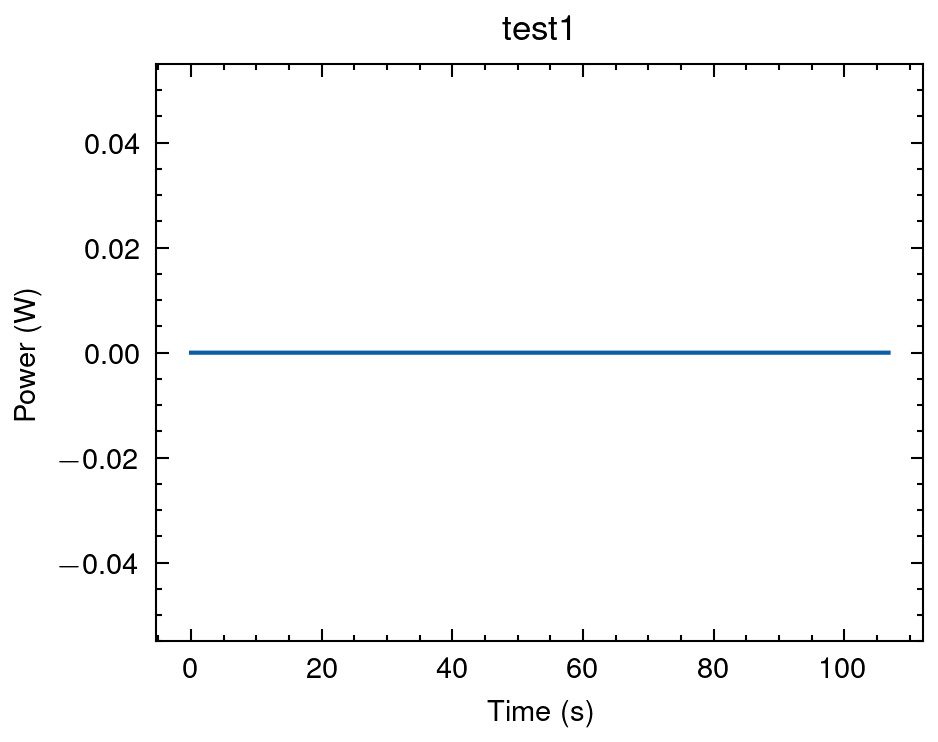

 54%|█████▍    | 7/13 [00:03<00:02,  2.09it/s]

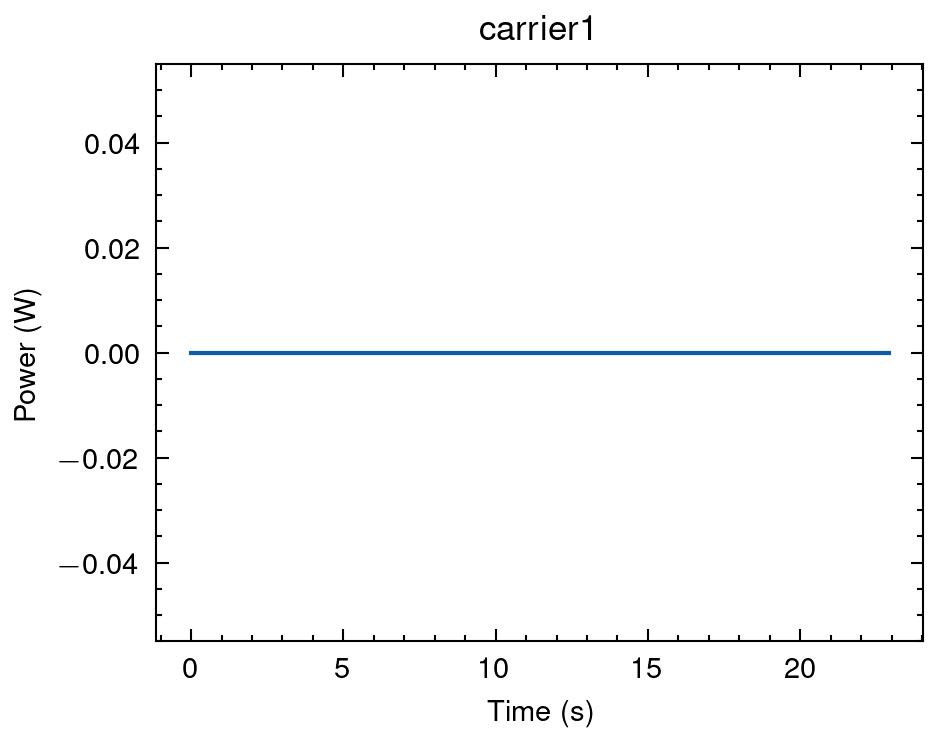

 62%|██████▏   | 8/13 [00:03<00:01,  2.66it/s]

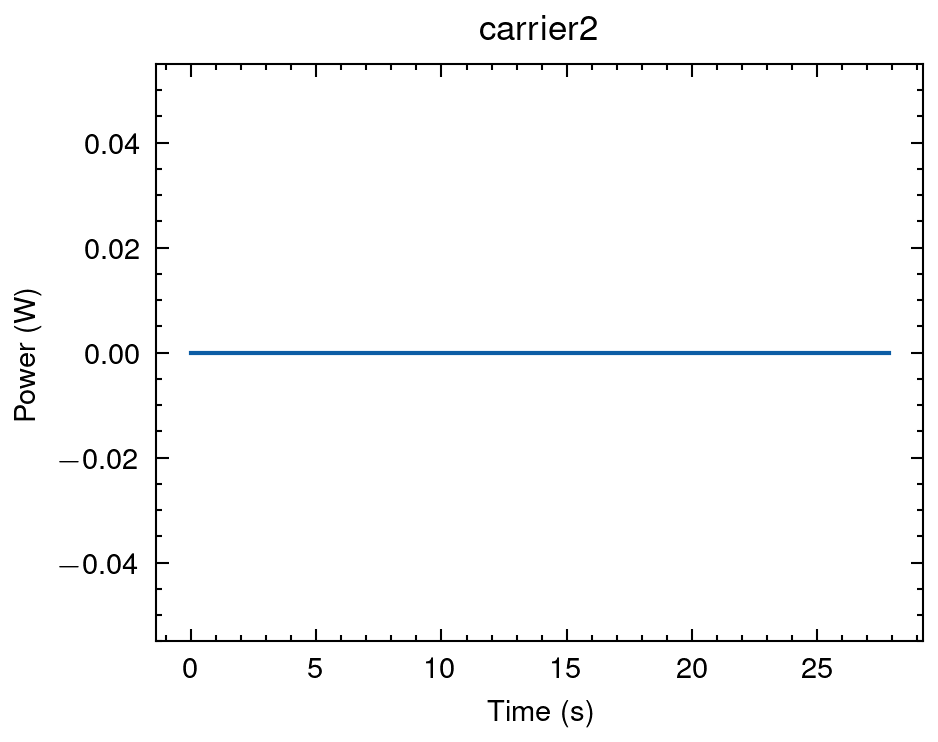

 69%|██████▉   | 9/13 [00:03<00:01,  3.19it/s]

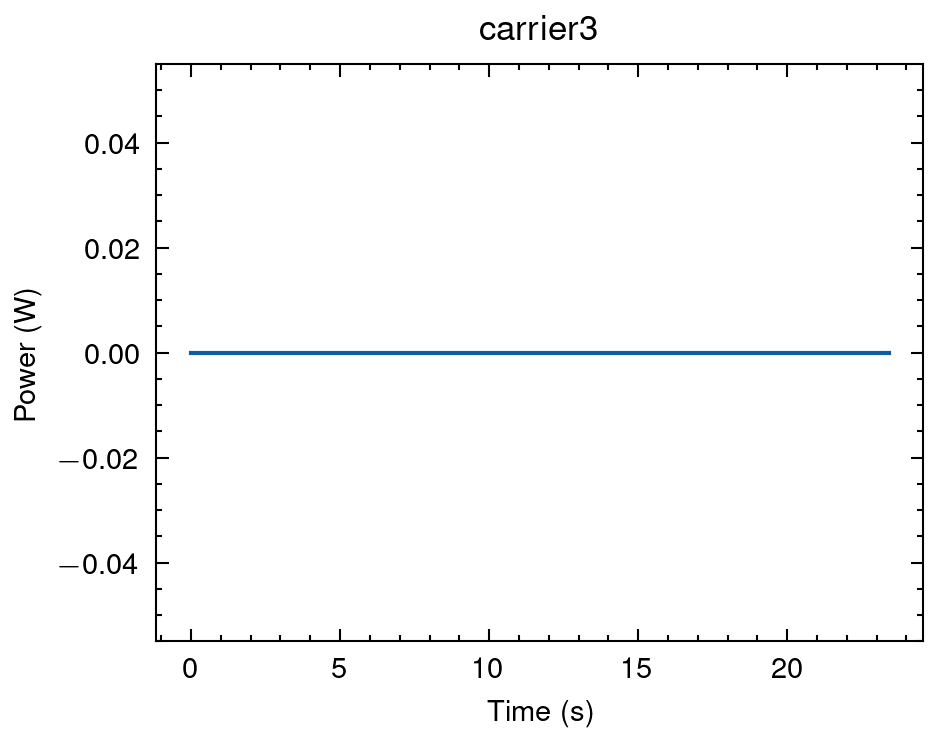

 77%|███████▋  | 10/13 [00:03<00:00,  3.74it/s]

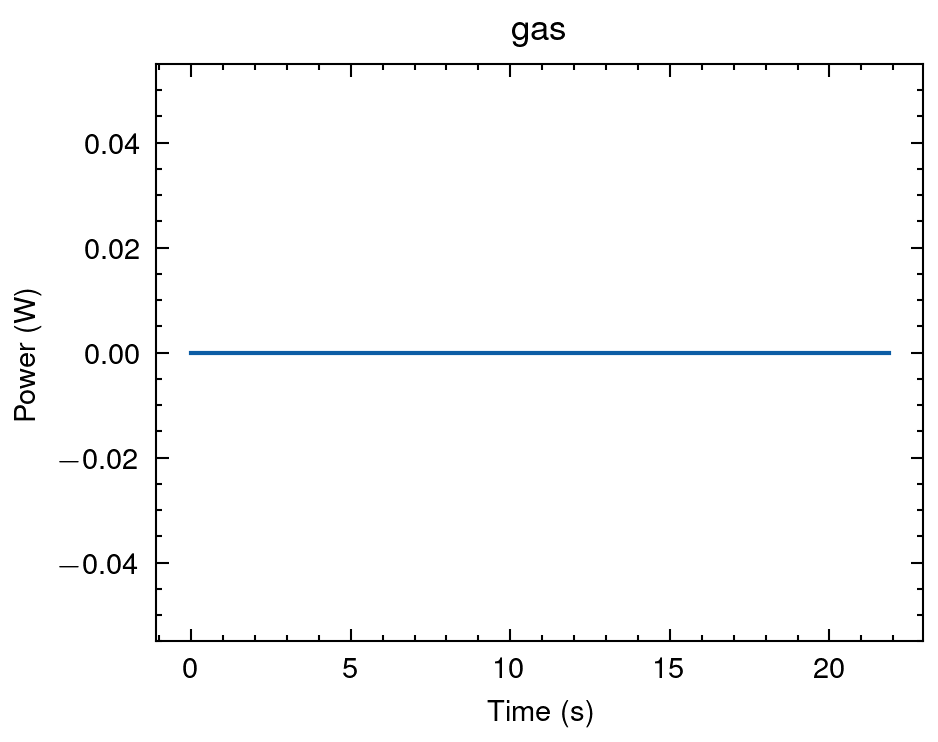

 85%|████████▍ | 11/13 [00:04<00:00,  4.01it/s]

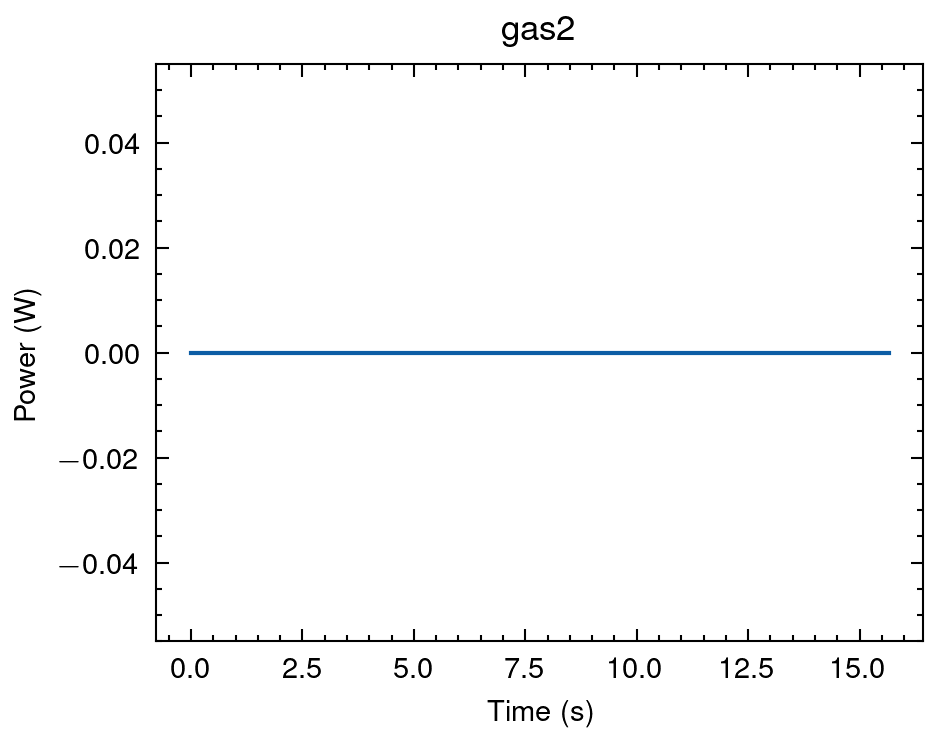

 92%|█████████▏| 12/13 [00:04<00:00,  4.51it/s]

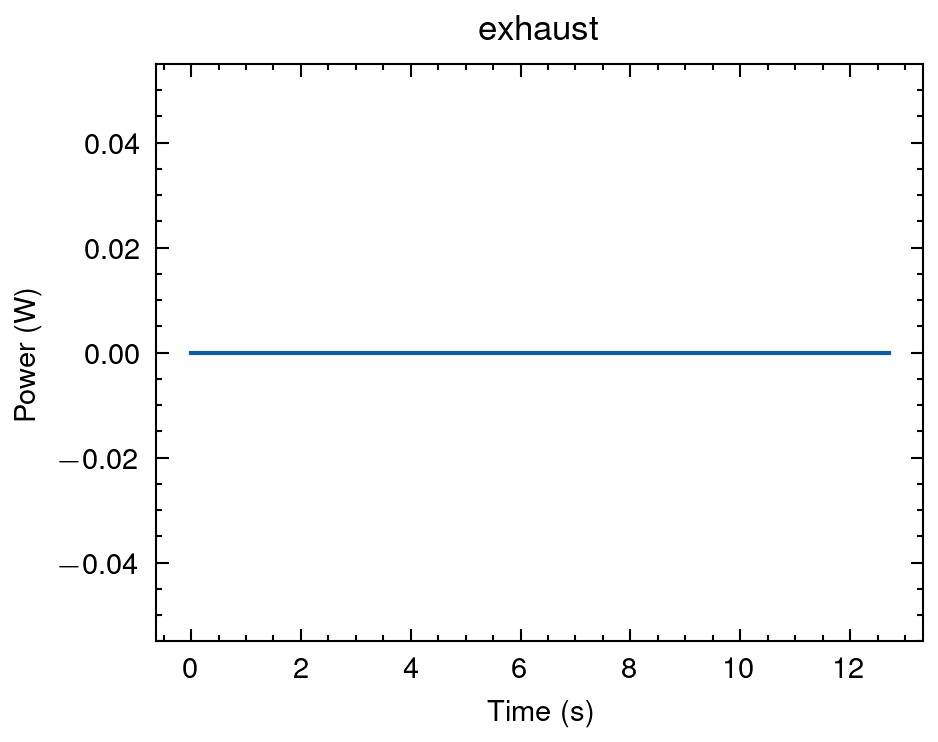

100%|██████████| 13/13 [00:04<00:00,  2.95it/s]


In [ ]:
for _i in tqdm(contextDF.index[:-1]):
    tdms_OPC  = TdmsFile(os.path.join(data_dir,_i,"OPC_UA_data.tdms"))
    _power = (tdms_OPC.groups()[1]).channels()[0].data
    _t=np.linspace(0,_power.shape[0]/sampling_rate_opc,_power.shape[0])
    
    fig,ax = plt.subplots()

    ax.set_title(f"{_i}")
    ax.set_xlabel("Time (s)")
    ax.set_ylabel("Power (W)")
    ax.plot(_t,_power,color=cm_std[0])
    plt.show()

### Inspect the powder

  0%|          | 0/13 [00:00<?, ?it/s]

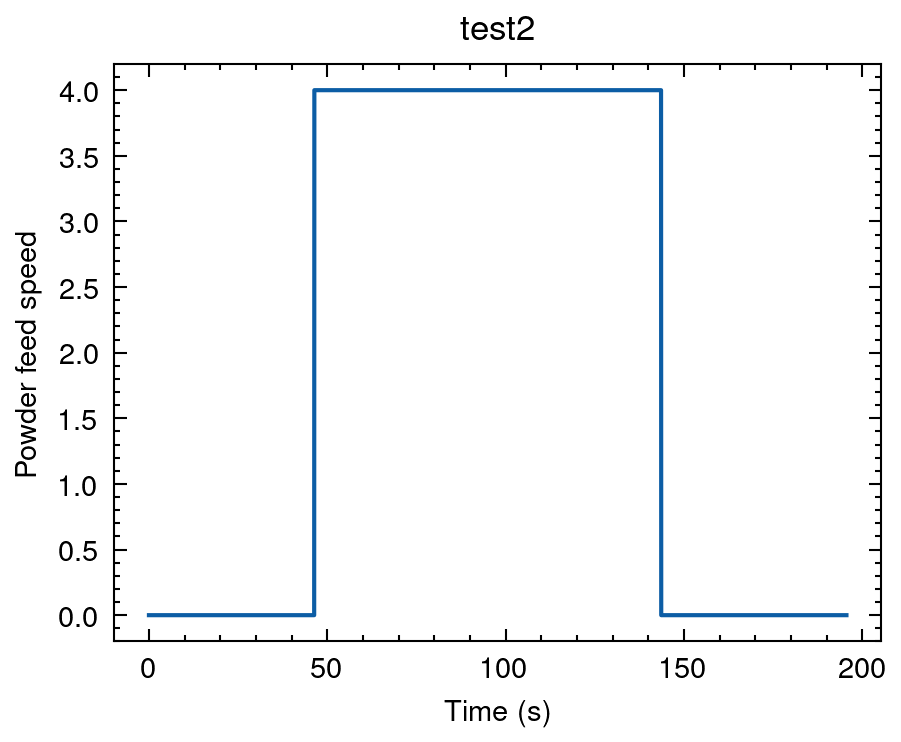

  8%|▊         | 1/13 [00:00<00:05,  2.11it/s]

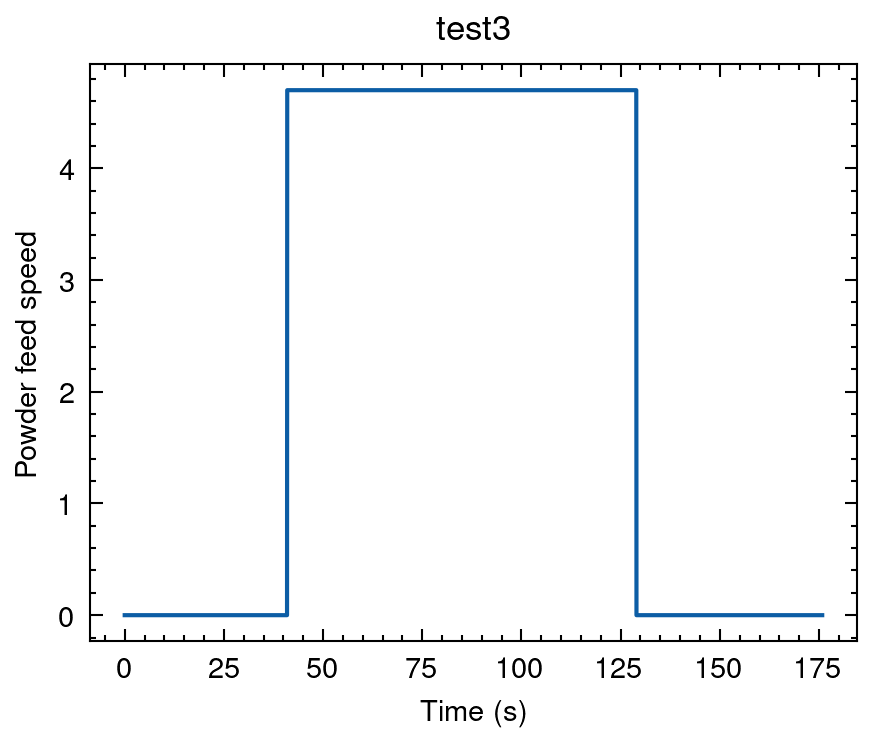

 15%|█▌        | 2/13 [00:00<00:05,  2.11it/s]

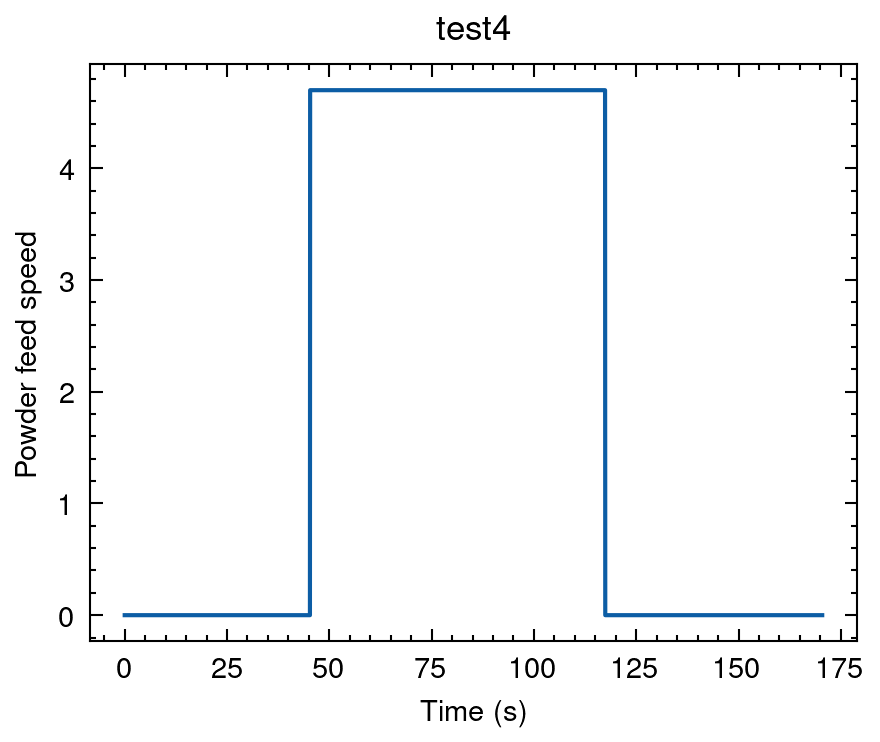

 23%|██▎       | 3/13 [00:01<00:04,  2.17it/s]

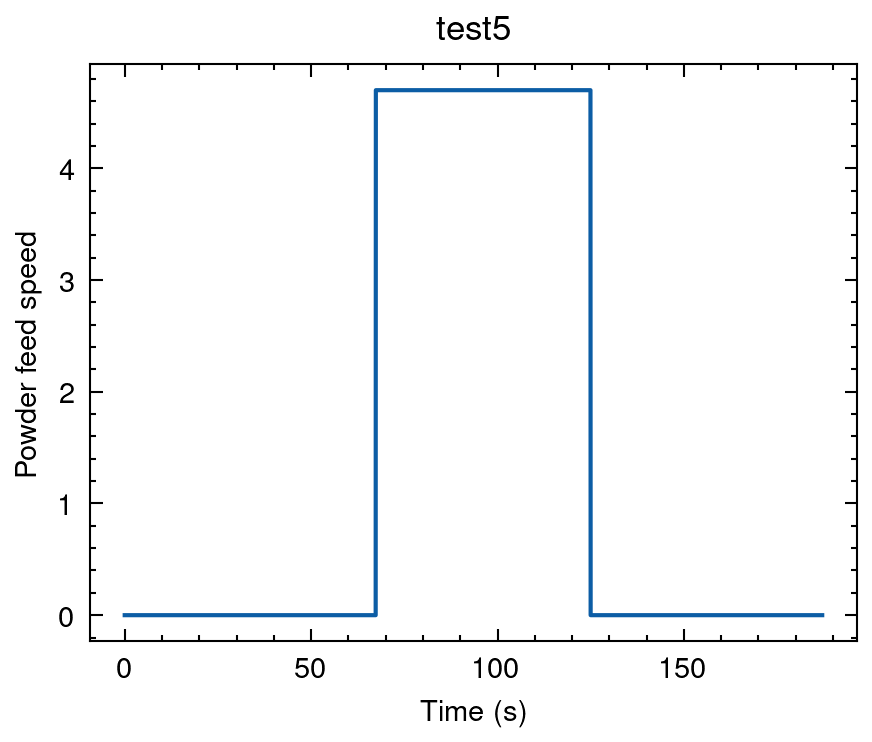

 31%|███       | 4/13 [00:01<00:04,  2.24it/s]

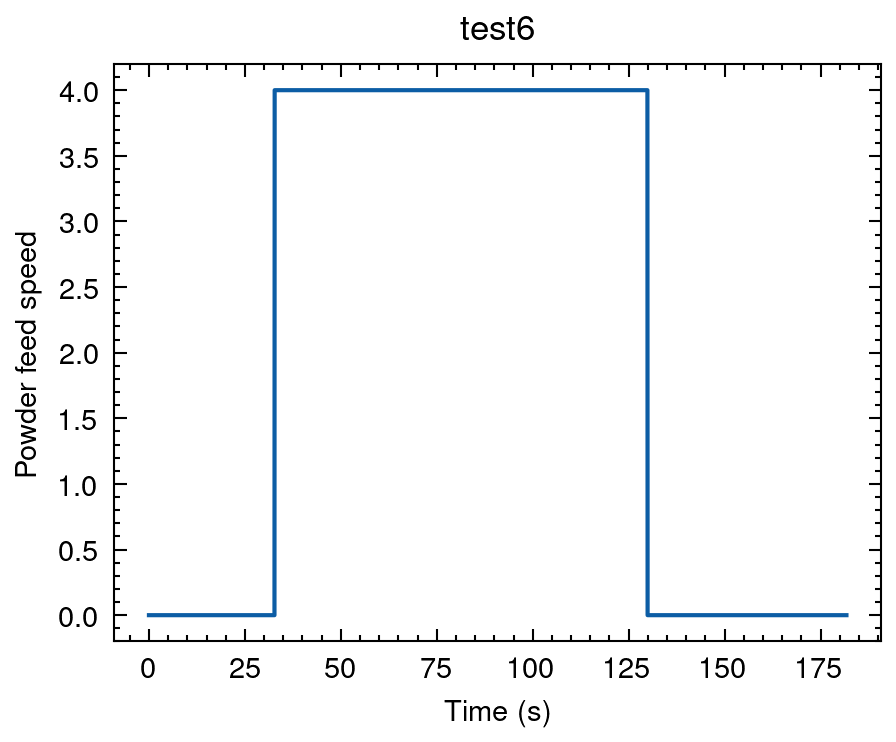

 38%|███▊      | 5/13 [00:02<00:03,  2.13it/s]

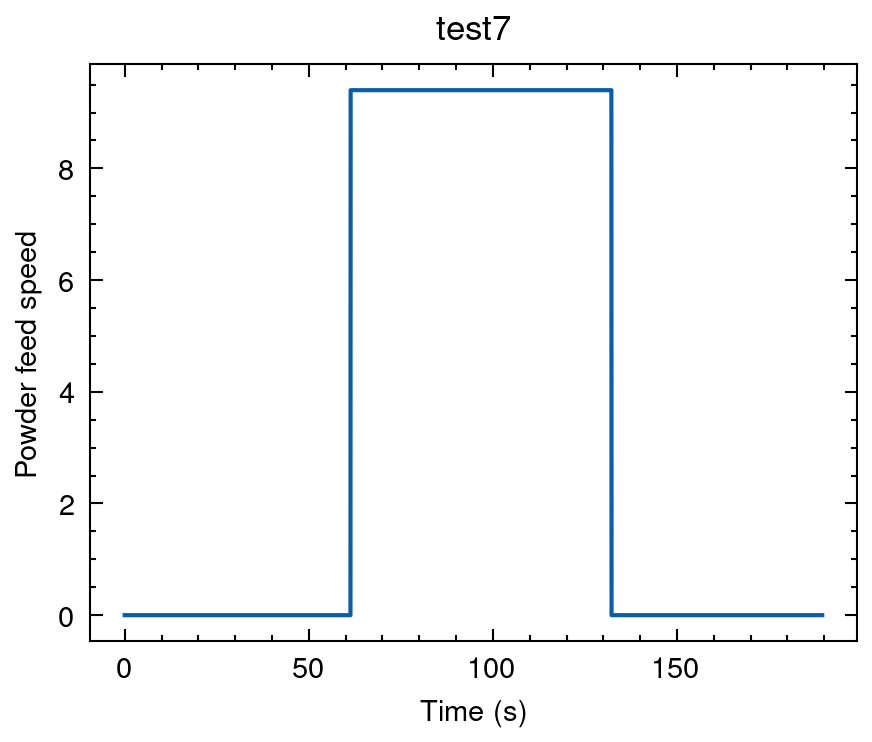

 46%|████▌     | 6/13 [00:02<00:03,  2.18it/s]

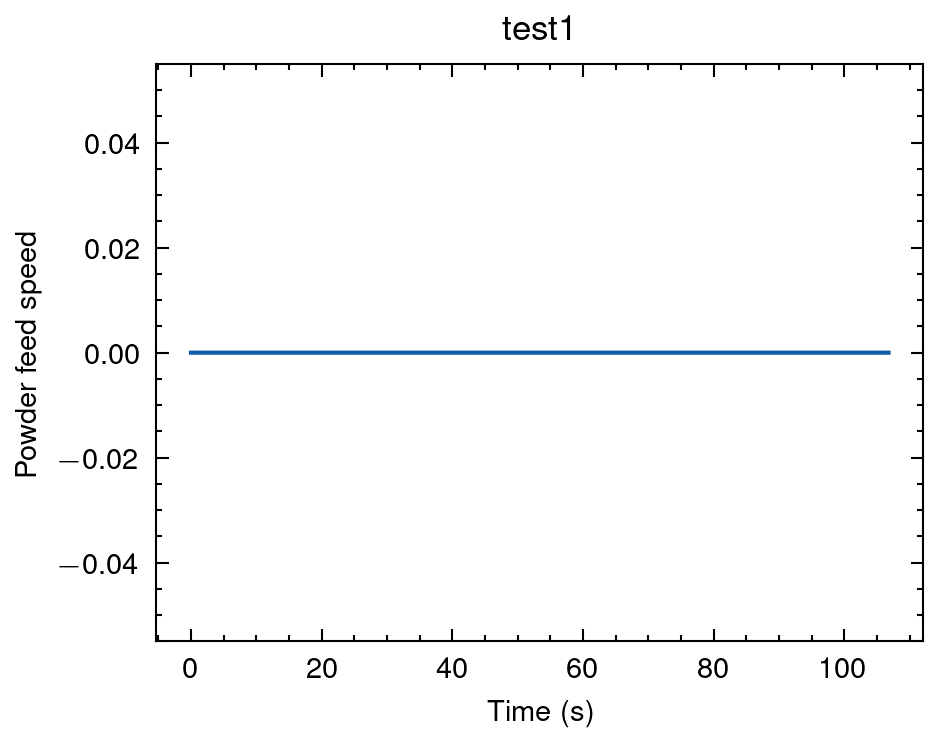

 54%|█████▍    | 7/13 [00:03<00:02,  2.44it/s]

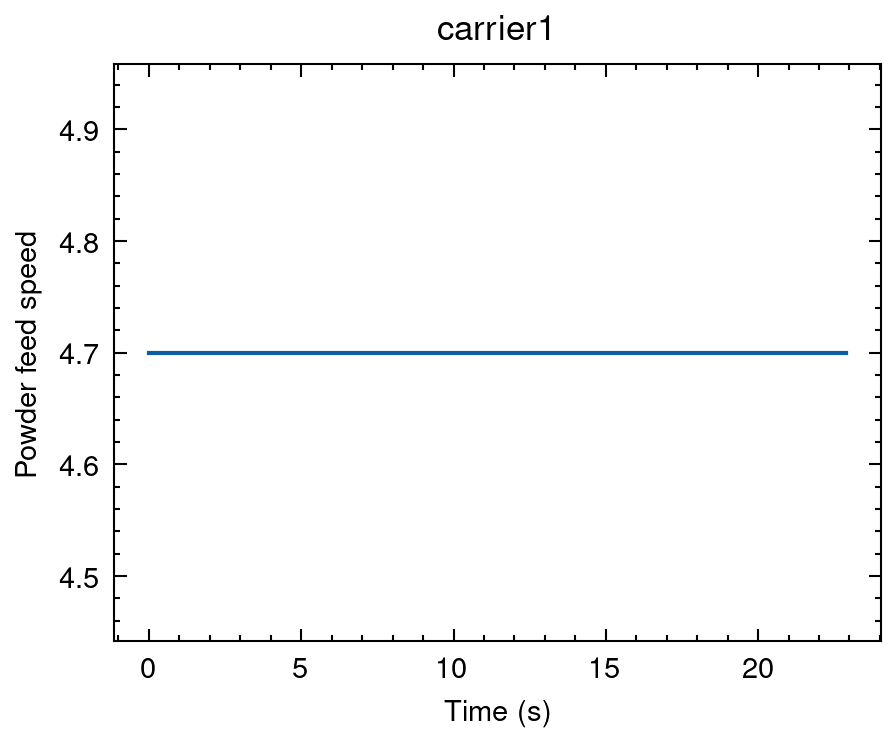

 62%|██████▏   | 8/13 [00:03<00:01,  3.01it/s]

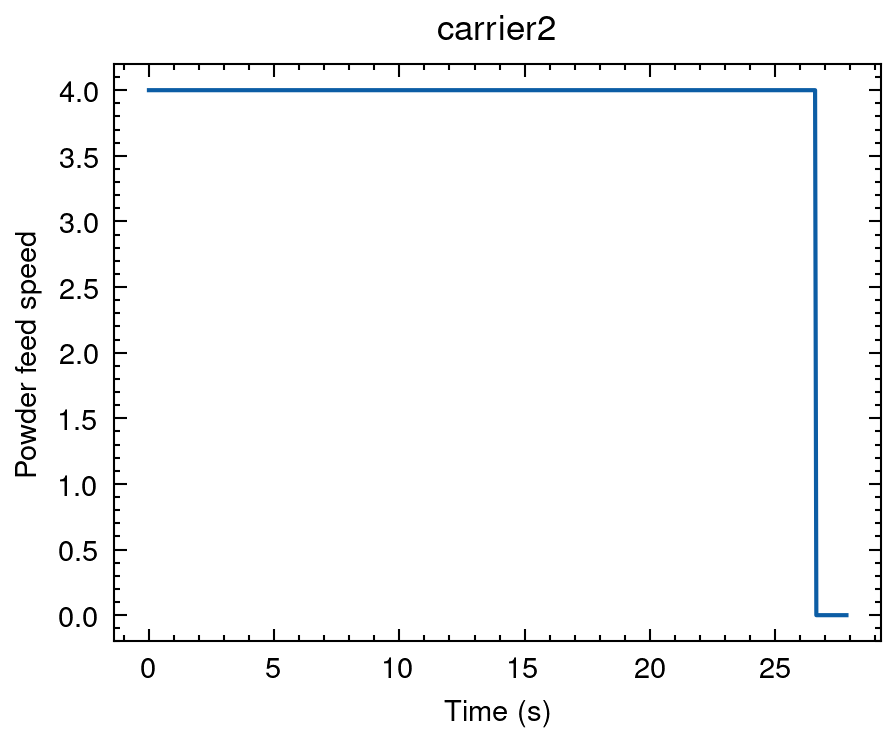

 69%|██████▉   | 9/13 [00:03<00:01,  3.25it/s]

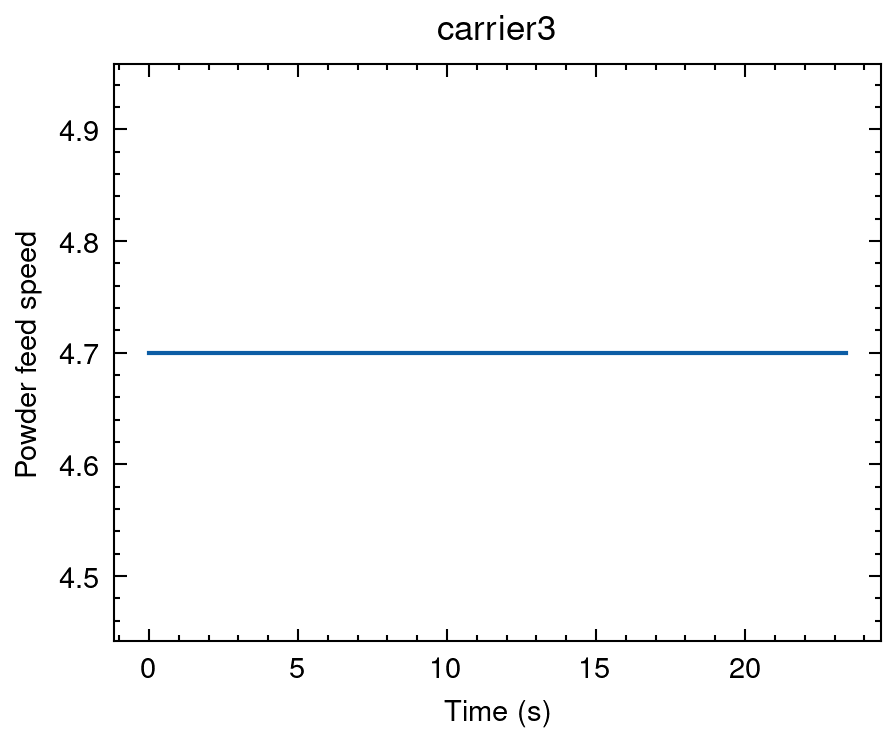

 77%|███████▋  | 10/13 [00:03<00:00,  3.78it/s]

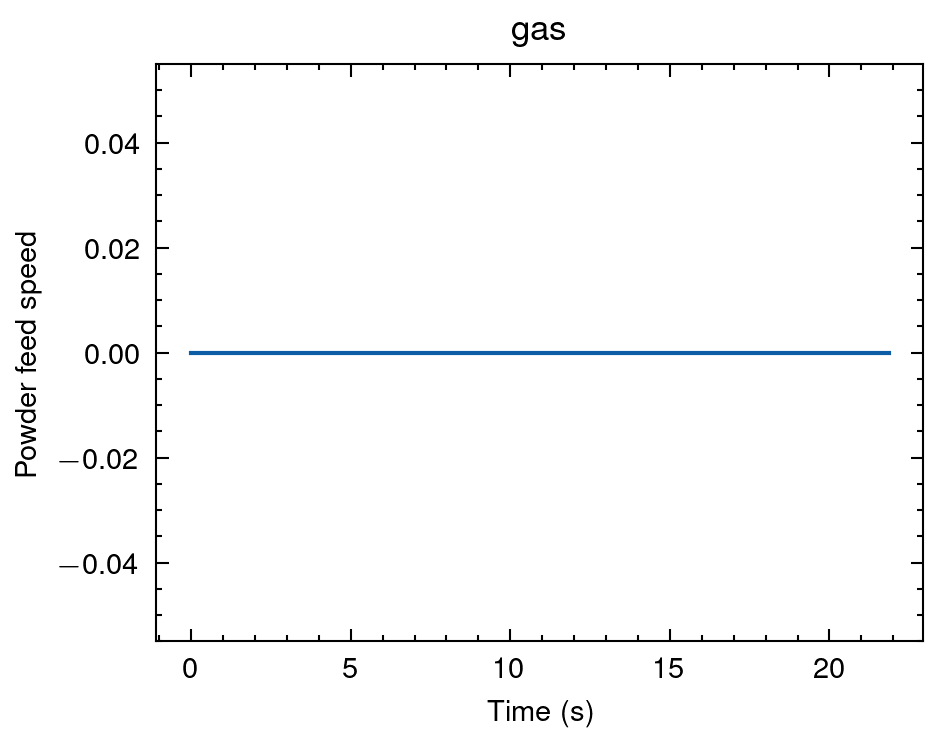

 85%|████████▍ | 11/13 [00:03<00:00,  4.33it/s]

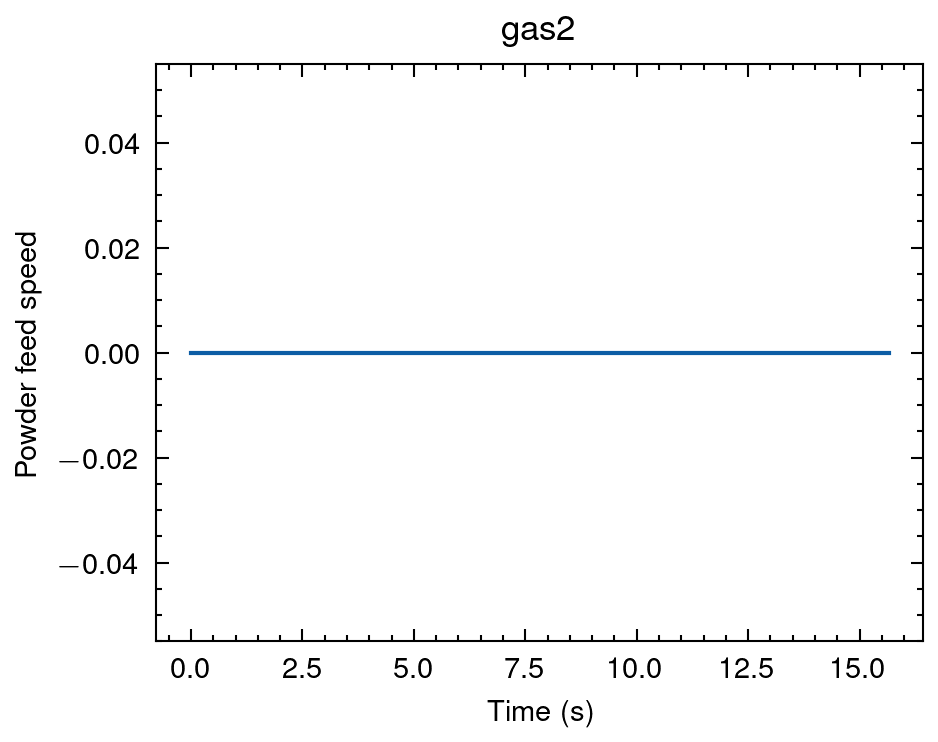

 92%|█████████▏| 12/13 [00:03<00:00,  4.74it/s]

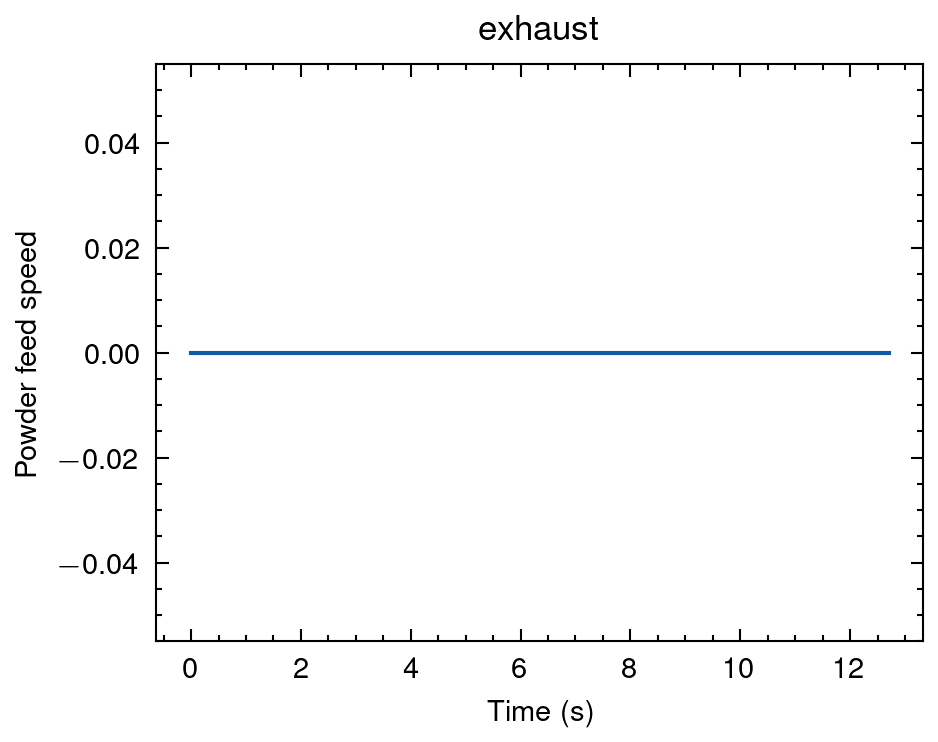

100%|██████████| 13/13 [00:04<00:00,  3.15it/s]


In [ ]:
for _i in tqdm(contextDF.index[:-1]):
    tdms_OPC  = TdmsFile(os.path.join(data_dir,_i,"OPC_UA_data.tdms"))
    _power = (tdms_OPC.groups()[0]).channels()[5].data
    _t=np.linspace(0,_power.shape[0]/sampling_rate_opc,_power.shape[0])
    
    fig,ax = plt.subplots()

    ax.set_title(f"{_i}")
    ax.set_xlabel("Time (s)")
    ax.set_ylabel("Powder feed speed")
    ax.plot(_t,_power,color=cm_std[0])
    plt.show()

### tdms structure

In [ ]:
tdms_mic  = TdmsFile(os.path.join(data_dir,contextDF.index[2],"AI_data.tdms"))
mic_name = tdms_mic.properties['name']
_mic = (tdms_mic.groups()[1]).channels()[0].data

In [ ]:
print_tdms_structure(os.path.join(data_dir,contextDF.index[0],"OPC_UA_data.tdms"))

OPC_UA_data
├── Powder Group
│   ├── PowderFeeder_currentWeight_H1
│   │   ├── NI_ArrayColumn: 0
│   ├── PowderFeeder_currentWeight_H2
│   │   ├── NI_ArrayColumn: 1
│   ├── PowderFeeder_REALCARRIERGAS_H1
│   │   ├── NI_ArrayColumn: 2
│   ├── PowderFeeder_REALCARRIERGAS_H2
│   │   ├── NI_ArrayColumn: 3
│   ├── PowderFeeder_POWDERFEEDSPEED_H1
│   │   ├── NI_ArrayColumn: 4
│   ├── PowderFeeder_POWDERFEEDSPEED_H2
│   │   ├── NI_ArrayColumn: 5
├── Laser Group
│   ├── GO_LaserLine_POWER_VALUE
│   │   ├── NI_ArrayColumn: 0
│   ├── GI_LaserLine_POWER
│   │   ├── NI_ArrayColumn: 1
├── Robot Group
│   ├── Coord_A
│   │   ├── NI_ArrayColumn: 0
│   ├── Coord_B
│   │   ├── NI_ArrayColumn: 1
│   ├── Coord_X
│   │   ├── NI_ArrayColumn: 2
│   ├── Coord_Y
│   │   ├── NI_ArrayColumn: 3
│   ├── Coord_Z
│   │   ├── NI_ArrayColumn: 4
└── File Property name: OPC_UA_data


In [ ]:
print_tdms_structure(os.path.join(data_dir,contextDF.index[2],"AI_data.tdms"))

AI_data
├── _unnamedTask<A>
│   ├── PXI1Slot3/ai0
│   │   ├── NI_Scaling_Status: unscaled
│   │   ├── NI_Number_Of_Scales: 2
│   │   ├── NI_Scale[1]_Scale_Type: Polynomial
│   │   ├── NI_Scale[1]_Polynomial_Coefficients_Size: 4
│   │   ├── NI_Scale[1]_Polynomial_Coefficients[0]: -3.439835920241493e-05
│   │   ├── NI_Scale[1]_Polynomial_Coefficients[1]: 0.00015614254075147285
│   │   ├── NI_Scale[1]_Polynomial_Coefficients[2]: 1.2871724520882197e-14
│   │   ├── NI_Scale[1]_Polynomial_Coefficients[3]: 6.123600502589501e-19
│   │   ├── NI_Scale[1]_Polynomial_Input_Source: 0
│   │   ├── NI_ChannelName: PXI1Slot3/ai0
│   │   ├── unit_string: Volts
│   │   ├── NI_UnitDescription: Volts
│   │   ├── wf_start_time: 2024-06-26T10:22:20.778540
│   │   ├── wf_increment: 4.999999999999579e-07
│   │   ├── wf_start_offset: 0.0
│   │   ├── wf_samples: 1
│   ├── PXI1Slot3/ai1
│   │   ├── NI_Scaling_Status: unscaled
│   │   ├── NI_Number_Of_Scales: 2
│   │   ├── NI_Scale[1]_Scale_Type: Polynomial
│   │ 

In [ ]:
mic = (tdms_mic.groups()[0]).channels()[0].data
mic = standardize_array(mic)
print(f"Total process time:{mic.shape[0]/sampling_rate}s")

Total process time:170.4s


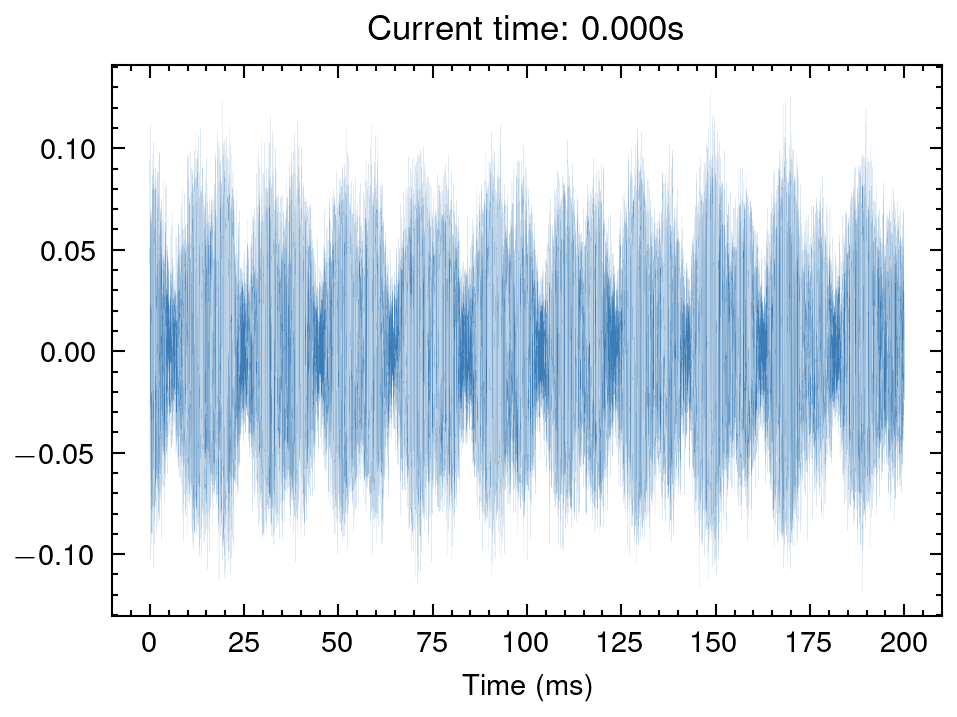

In [ ]:
start_i:int = int(sampling_rate*100)
roi_points:int = int(sampling_rate*0.2)
data = mic[start_i:start_i+roi_points]
_t=np.linspace(0,roi_points/sampling_rate*1e3,roi_points)
frames = np.linspace(0, mic.shape[0]-roi_points, int(mic.shape[0]/sampling_rate*60),dtype=int,endpoint=True)


def update(frame):
    data = mic[frame:frame+roi_points]
    ax.plot(_t,data,lw=0.02,alpha=0.8,c=cm_std[0])
    ax.set_title(f"Current time: {(frame/sampling_rate):.3f}s")

fig,ax=plt.subplots()
ax.plot(_t,data,lw=0.02,alpha=0.8,c=cm_std[0])
ax.set_xlabel("Time (ms)")
ax.set_title(f"Current time: {(start_i/sampling_rate):.3f}s")
# ani = animation.FuncAnimation(fig=fig, func=update, frames=frames[:10], interval=1000/60)
plt.tight_layout()
# ani.save(f'./outputs/test_mic_ROI{roi_points}.gif', writer='ffmpeg',dpi=150)


In [ ]:
n_fft=1024
hop_length=512
window_type ='hann'
mel_bins = 128
fmin=0
fmax=0.8*1e6
mel_power=2.0

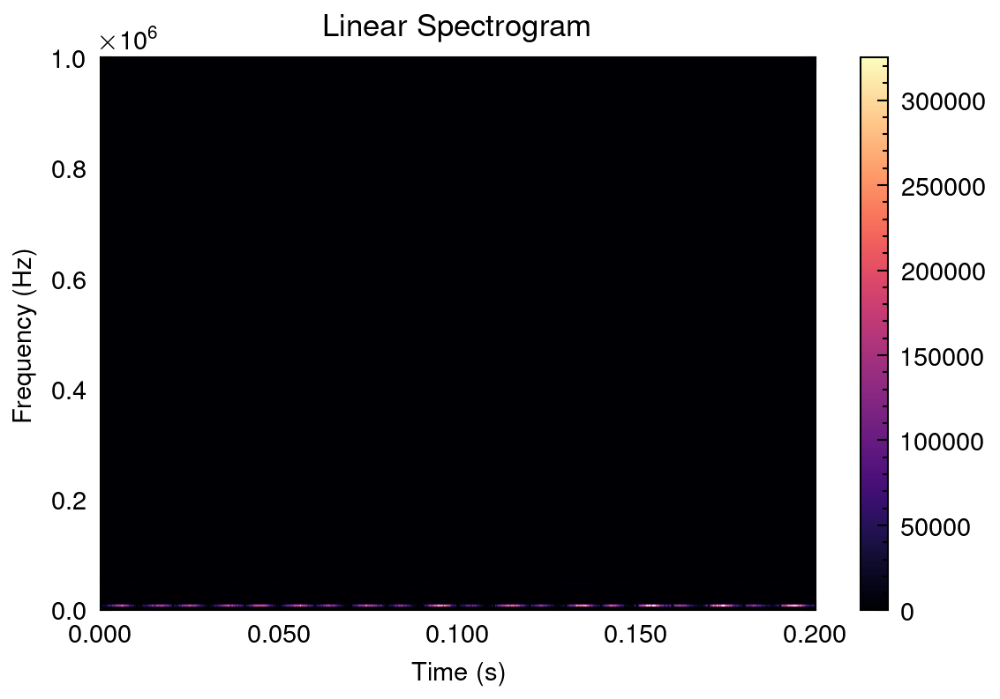

(513, 782)


In [ ]:
spec = linearSpectrogram(sampling_rate=sampling_rate,data=data,n_fft=n_fft,hop_length=hop_length,window_type=window_type,display=True)
print(spec.shape)

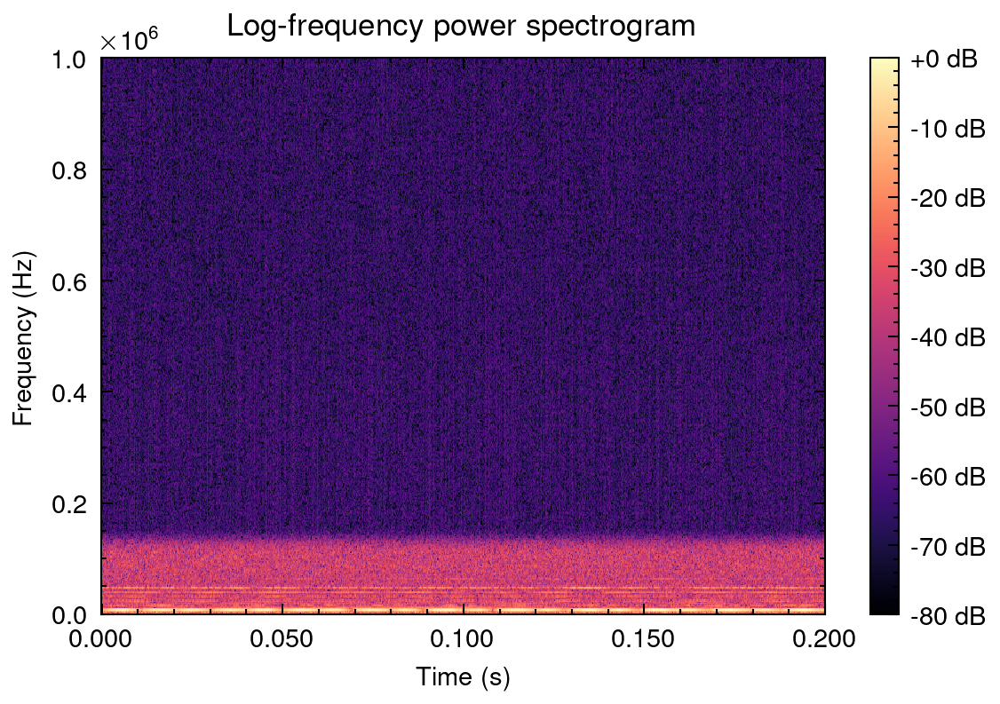

(513, 782)


In [ ]:
spec = logSpectrogram(sampling_rate=sampling_rate,data=data,n_fft=n_fft,hop_length=hop_length,window_type=window_type,display=True)
print(spec.shape)

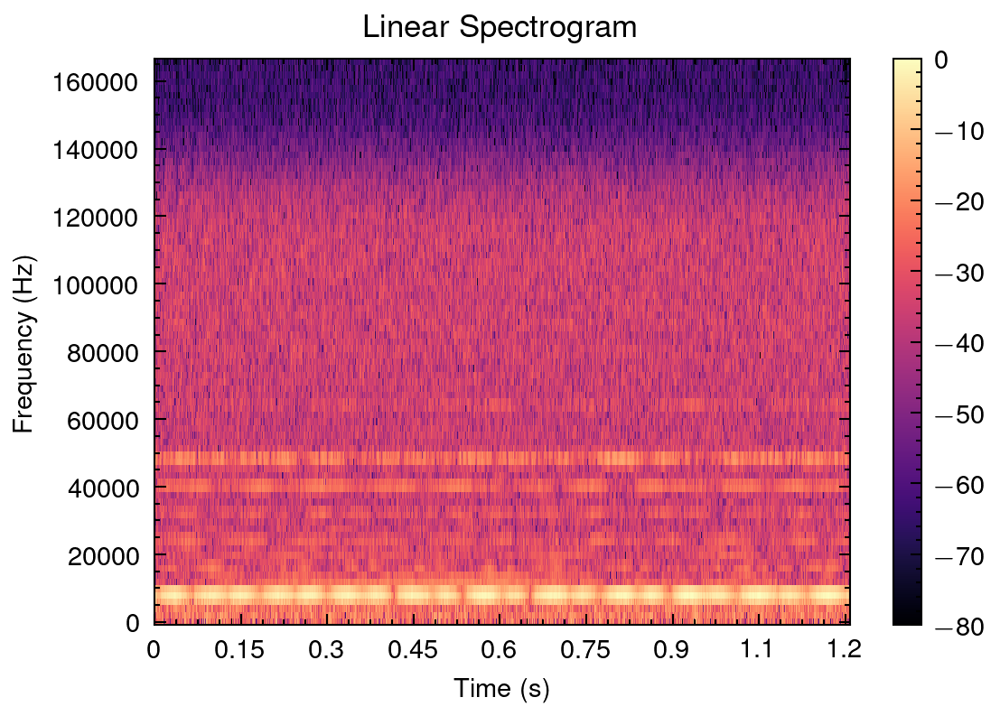

(85, 782)


In [ ]:
new_spec = spec[:int(spec.shape[0]/6),:]
ratio = new_spec.shape[0]/spec.shape[0]
fig,ax = plt.subplots(figsize=(10*centimeter, 7*centimeter))
librosa.display.specshow(spec[:int(spec.shape[0]/6),:], sr=sampling_rate*ratio, x_axis='time', y_axis='linear',hop_length=hop_length,fmax=fmax,fmin=fmin)
ax.set_title(f"Linear Spectrogram")
ax.set_xlabel("Time (s)")
ax.set_ylabel("Frequency (Hz)")
plt.colorbar()
plt.tight_layout()
plt.show()
print(new_spec.shape)

c:\Users\mingwucn\.conda\envs\ai\Lib\site-packages\librosa\feature\spectral.py:2143: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  mel_basis = filters.mel(sr=sr, n_fft=n_fft, **kwargs)


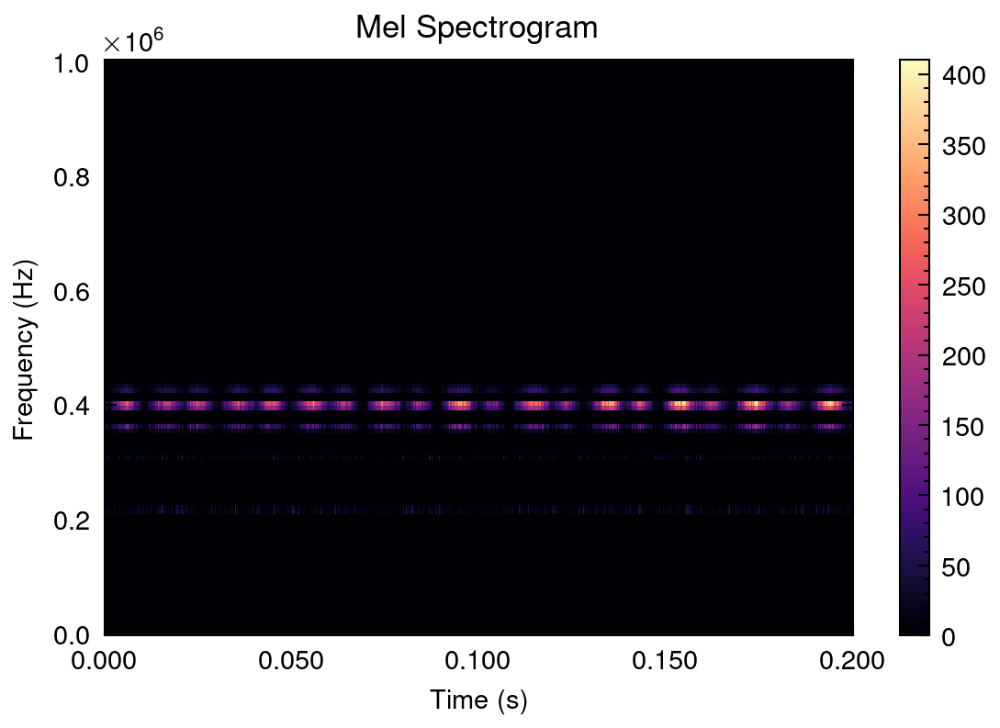

(128, 782)


In [ ]:
spec = melSpectrogram(sampling_rate=sampling_rate,data=data,n_fft=n_fft,hop_length=hop_length,window_type=window_type,mel_bins=mel_bins,fmin=fmin, fmax=fmax,display=True)
print(spec.shape)

c:\Users\mingwucn\.conda\envs\ai\Lib\site-packages\librosa\feature\spectral.py:2143: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  mel_basis = filters.mel(sr=sr, n_fft=n_fft, **kwargs)


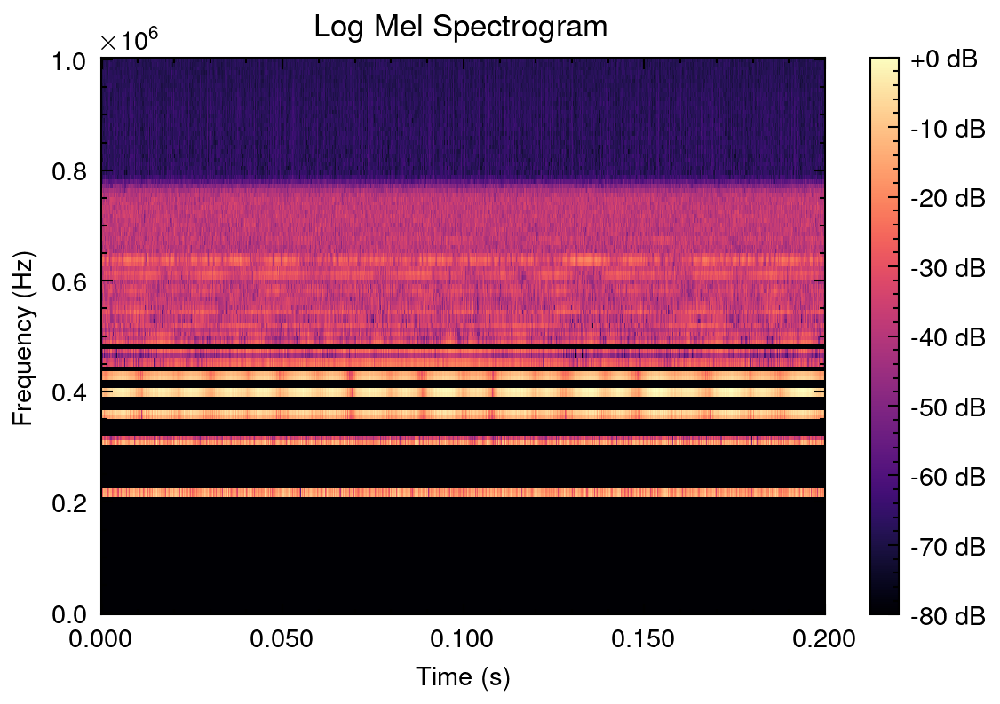

(128, 782)


In [ ]:
spec = logMelSpectrogram(sampling_rate=sampling_rate,data=data,n_fft=n_fft,hop_length=hop_length,window_type=window_type,mel_bins=mel_bins, fmin=fmin,fmax=fmax,display=True)
print(spec.shape)

0it [00:00, ?it/s]

File [test2] Total mic time:195.5s
File [test2] Total opc time:195.5s


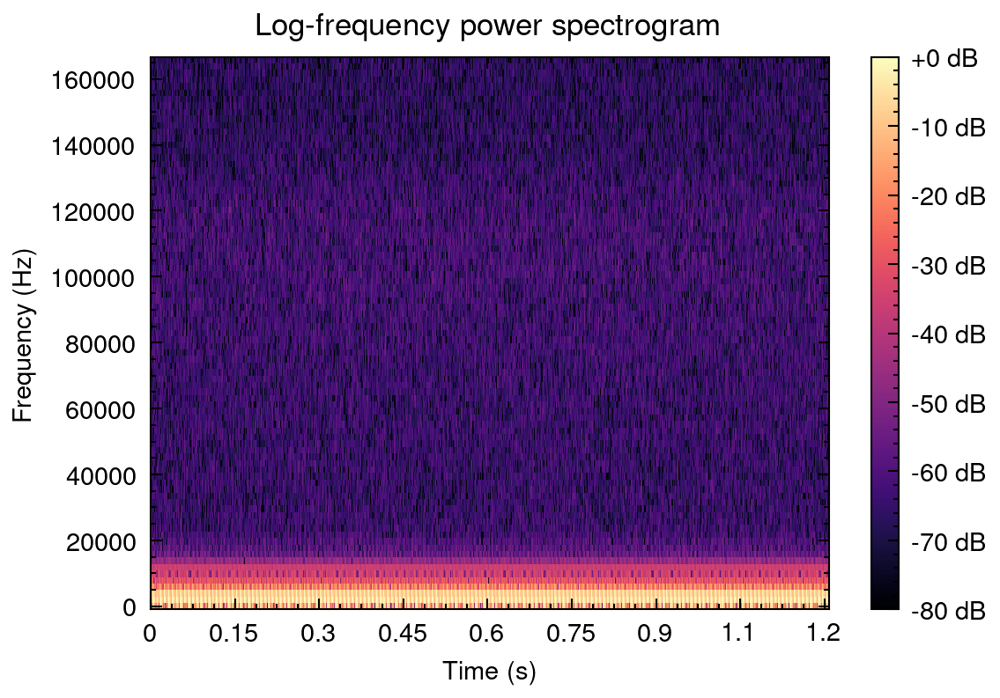

1it [00:24, 24.75s/it]

(85, 782)
File [test3] Total mic time:175.8s
File [test3] Total opc time:175.8s


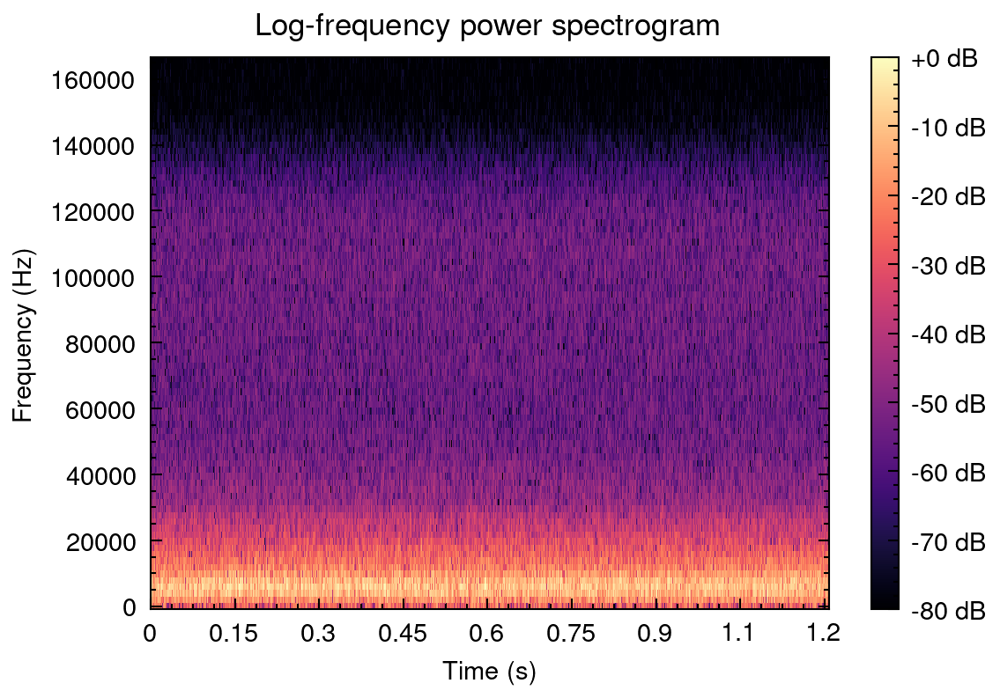

2it [00:49, 24.46s/it]

(85, 782)
File [test4] Total mic time:170.4s
File [test4] Total opc time:170.45s


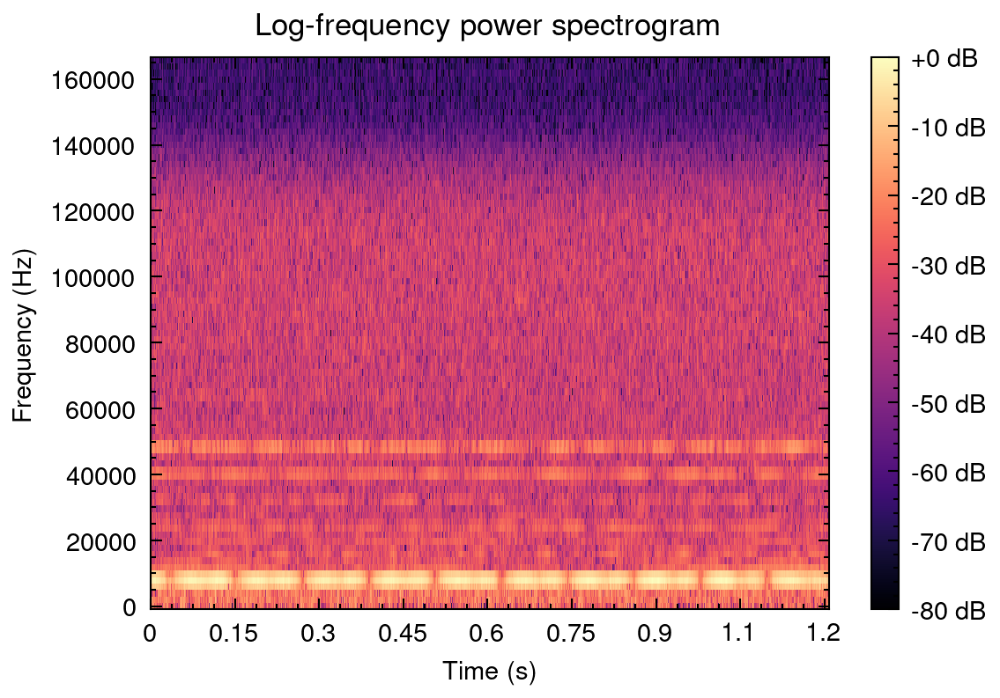

3it [01:10, 23.31s/it]

(85, 782)
File [test5] Total mic time:187.05s
File [test5] Total opc time:187.1s


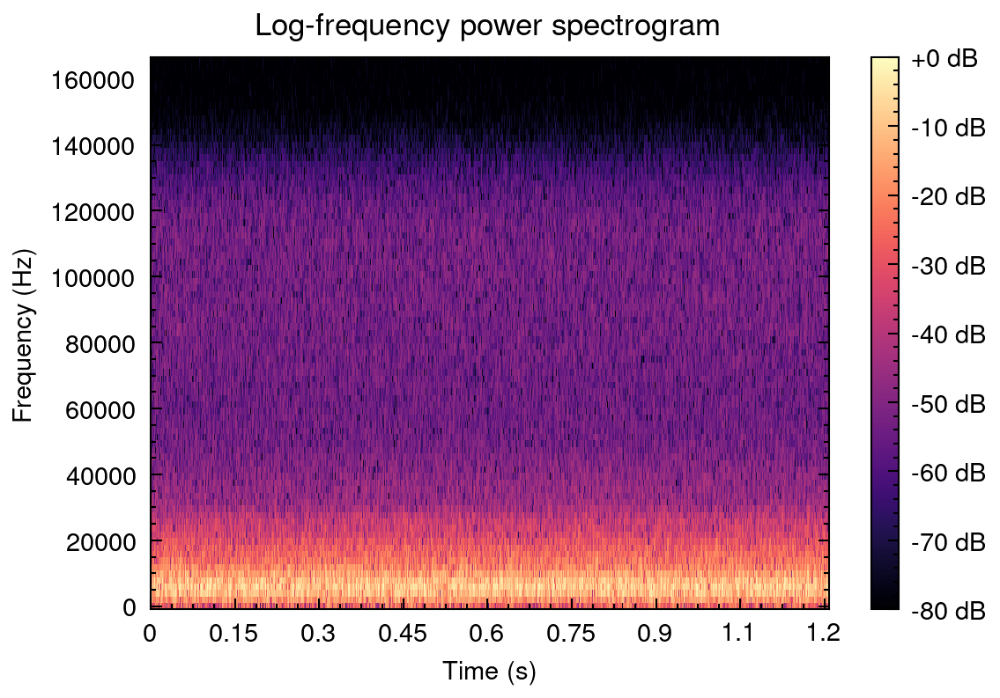

4it [01:34, 23.52s/it]

(85, 782)
File [test6] Total mic time:181.7s
File [test6] Total opc time:181.75s


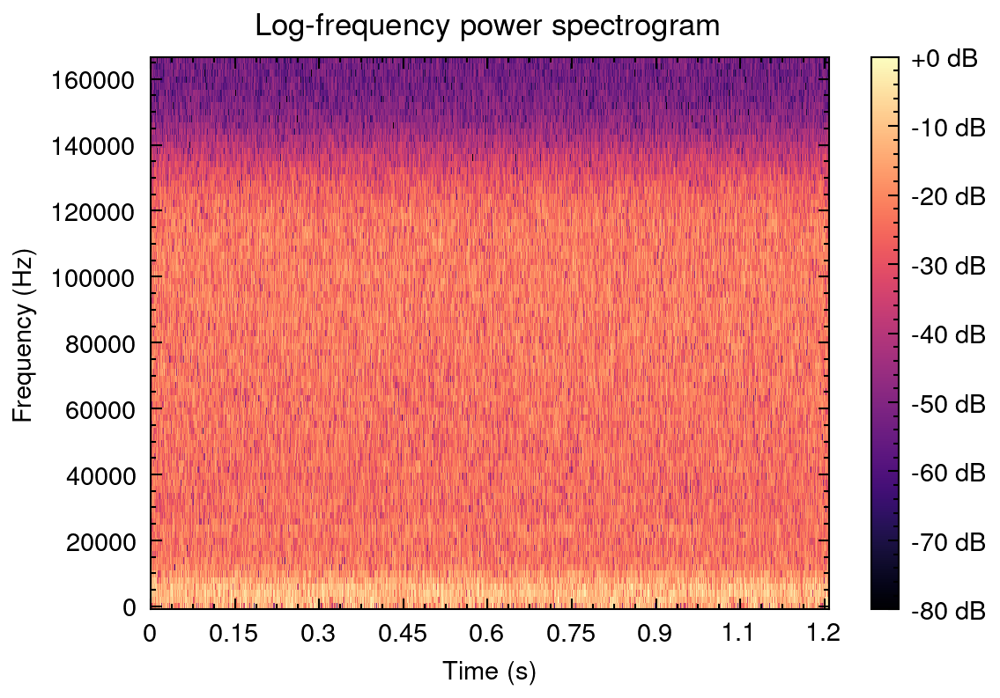

5it [01:58, 23.52s/it]

(85, 782)
File [test7] Total mic time:189.45s
File [test7] Total opc time:189.45s


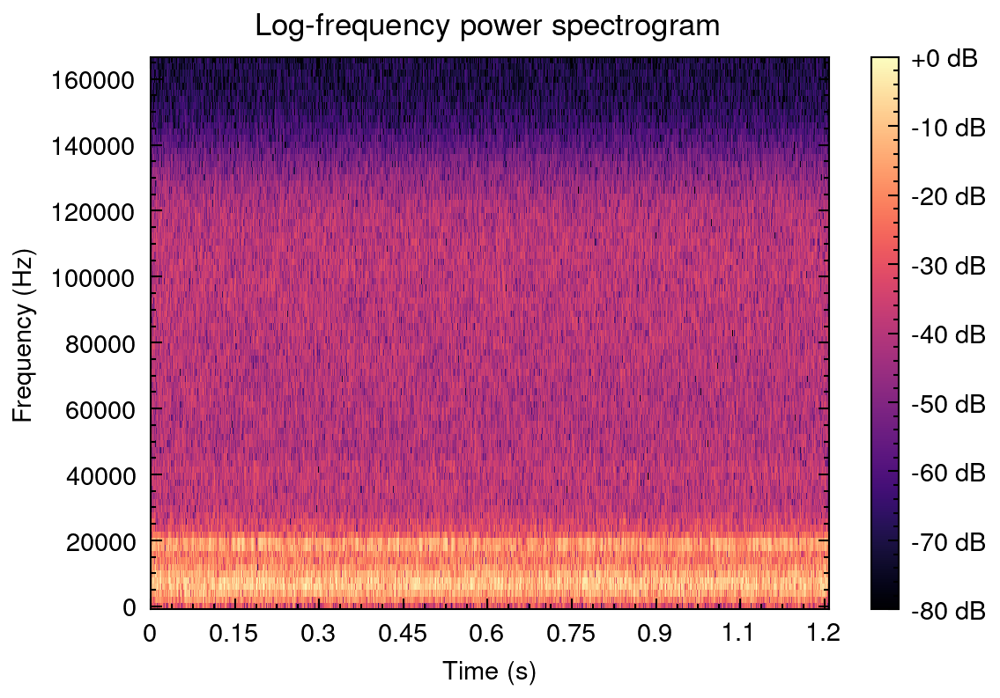

6it [02:24, 24.58s/it]

(85, 782)
File [test1] Total mic time:106.7s
File [test1] Total opc time:106.75s


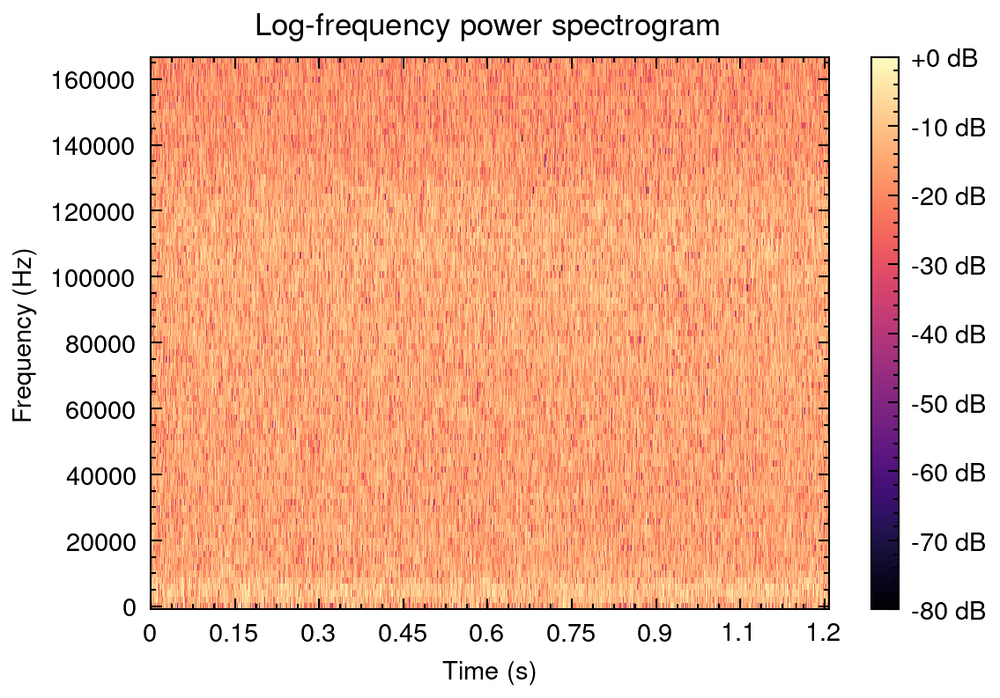

7it [02:38, 20.85s/it]

(85, 782)
File [carrier1] Total mic time:22.9s
File [carrier1] Total opc time:22.9s


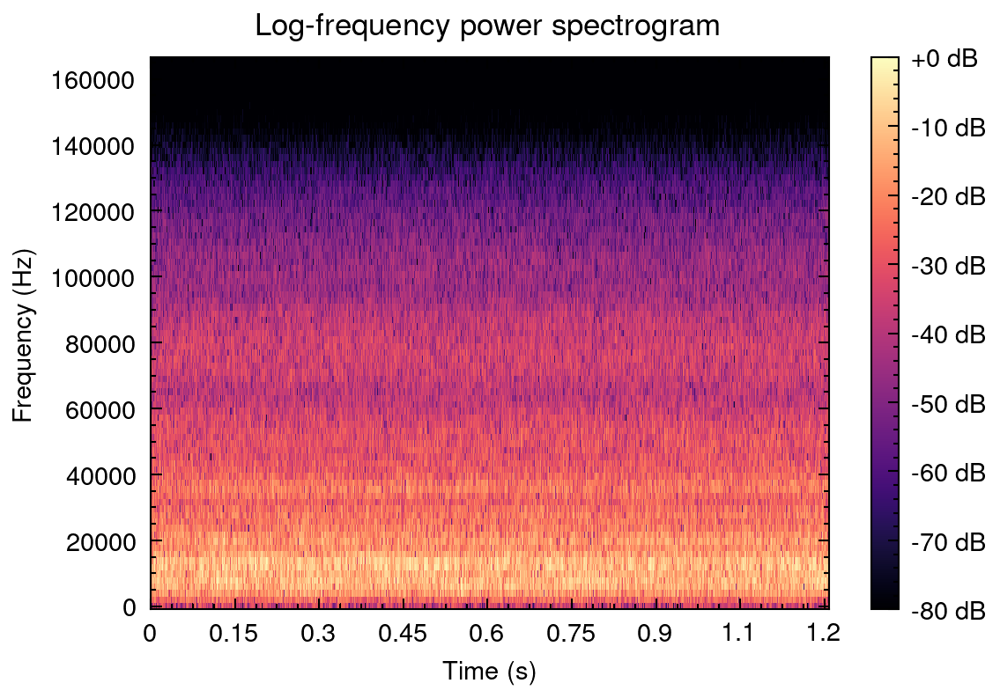

8it [02:41, 15.26s/it]

(85, 782)
File [carrier2] Total mic time:27.8s
File [carrier2] Total opc time:27.85s


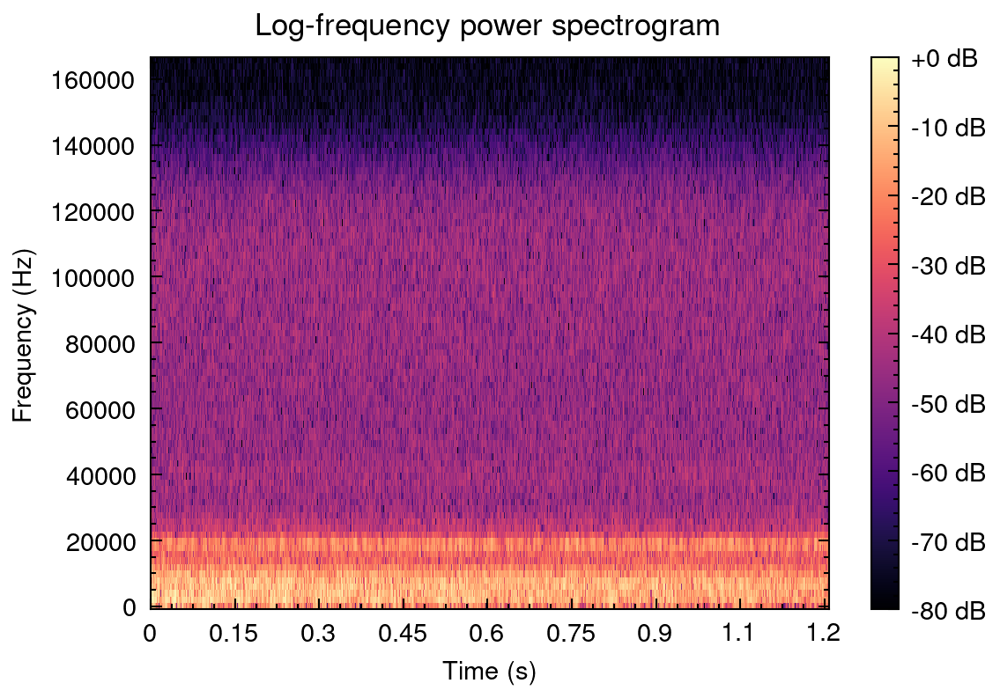

9it [02:45, 11.72s/it]

(85, 782)
File [carrier3] Total mic time:23.35s
File [carrier3] Total opc time:23.4s


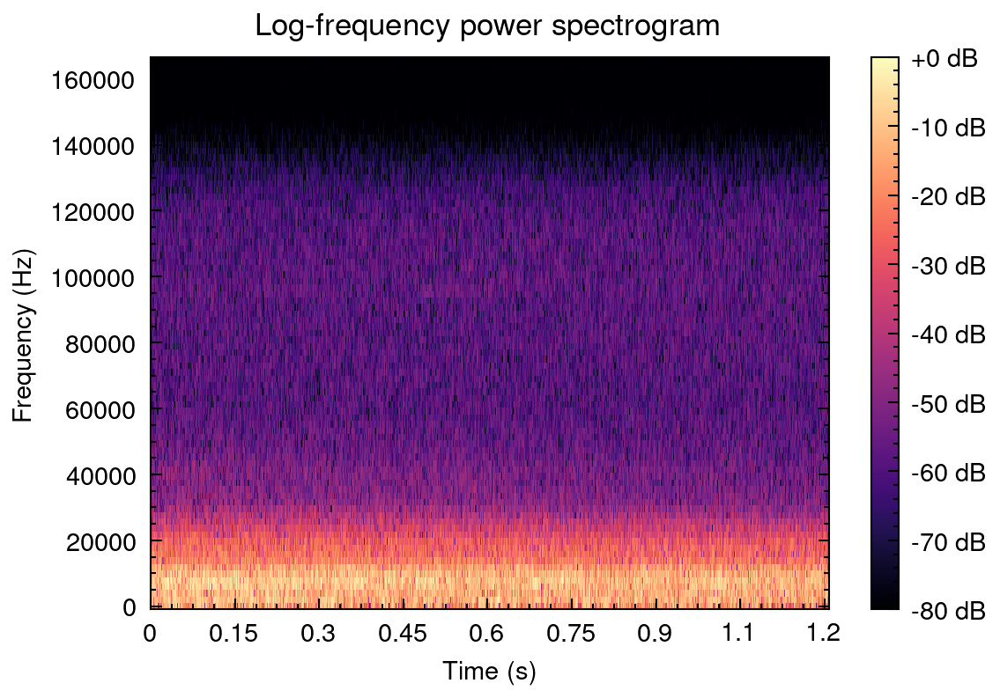

10it [02:48,  9.12s/it]

(85, 782)
File [gas] Total mic time:21.85s
File [gas] Total opc time:21.85s


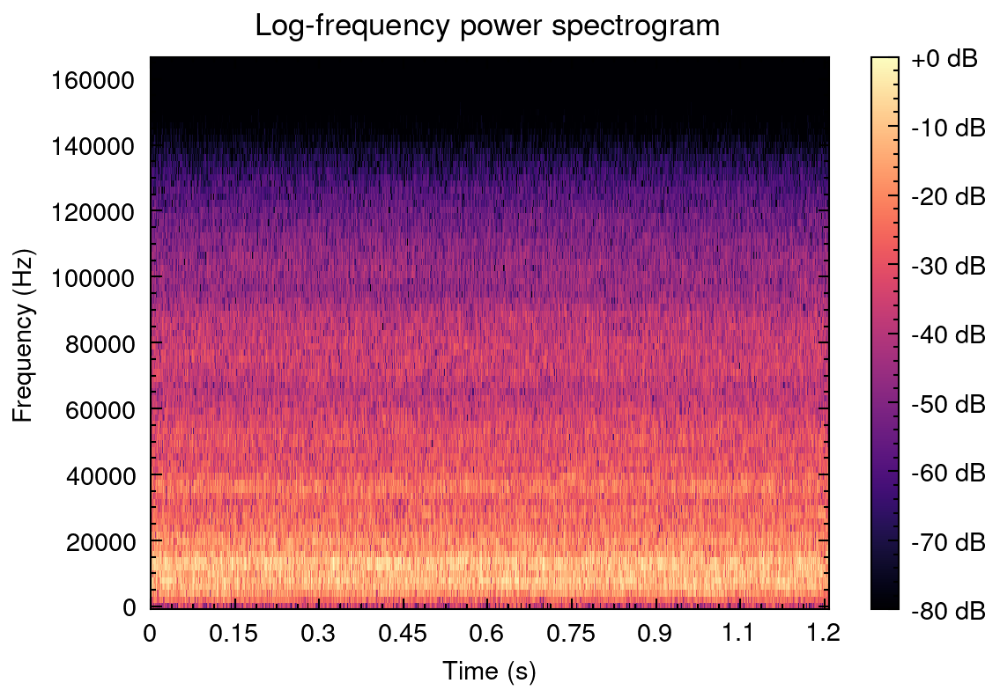

11it [02:51,  7.28s/it]

(85, 782)
File [gas2] Total mic time:15.6s
File [gas2] Total opc time:15.65s


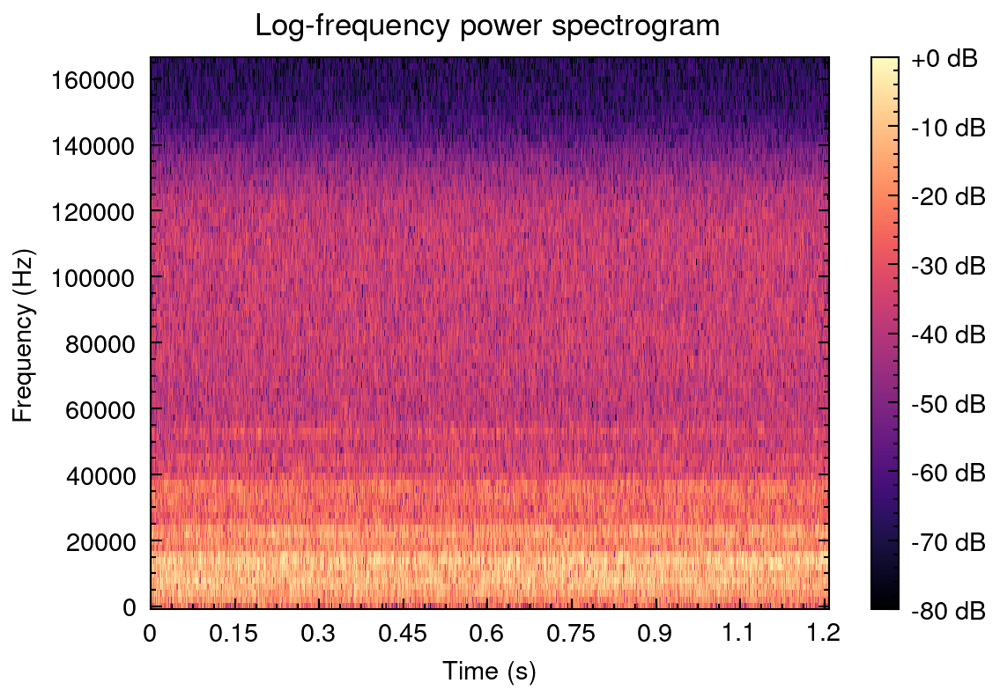

12it [02:54,  5.82s/it]

(85, 782)
File [exhaust] Total mic time:12.7s
File [exhaust] Total opc time:12.7s


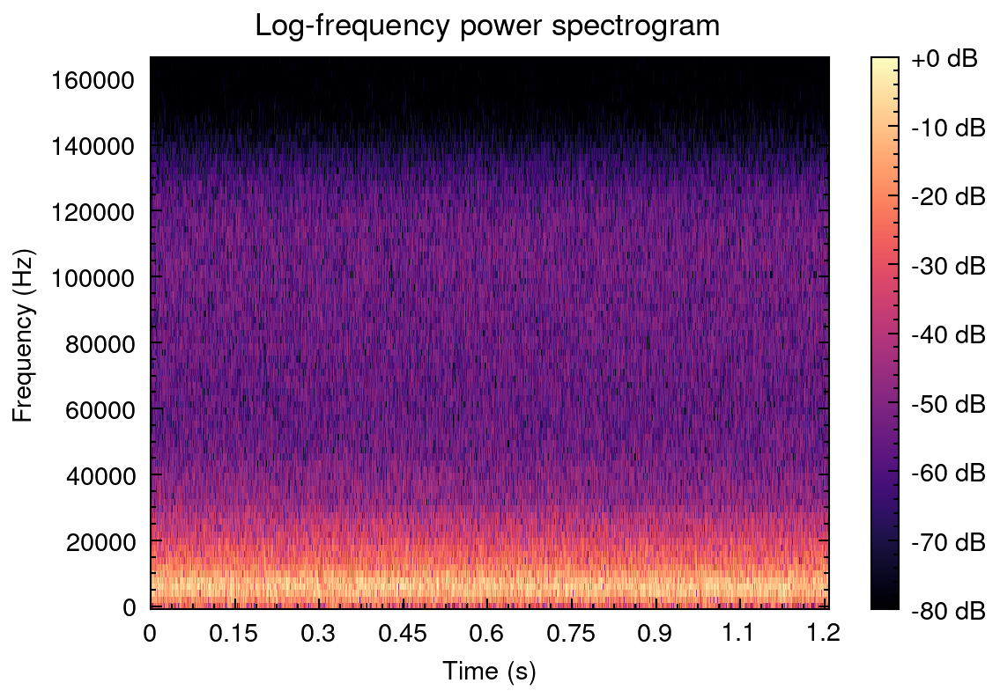

13it [02:56, 13.56s/it]

(85, 782)



[nptdms.base_segment WARNING] Cropping data from 457760 to 457752 bytes to match segment size derived from channels


File [idle] Total mic time:83.3s


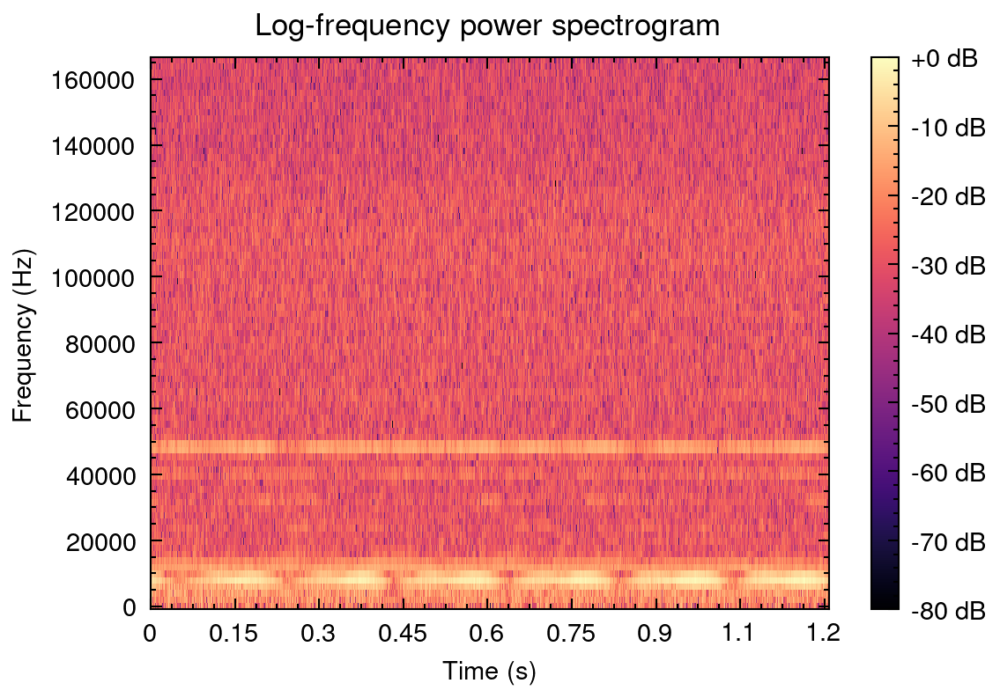

(85, 782)


In [ ]:
n_fft=1024
hop_length=512
window_type ='hann'
mel_bins = 128
fmin=0
fmax=0.8*1e6
mel_power=2.0

start_list = [100,100,100,100,100,100,100,1,1,1,1,1,1,100]
for _,_i in tqdm(enumerate(contextDF.index[:-1])):
    tdms_mic  = TdmsFile(os.path.join(data_dir,_i,"AI_data.tdms"))
    tdms_OPC  = TdmsFile(os.path.join(data_dir,_i,"OPC_UA_data.tdms"))
    _power = (tdms_OPC.groups()[1]).channels()[0].data
    mic = (tdms_mic.groups()[0]).channels()[0].data
    mic = standardize_array(mic)
    print(f"File [{_i}] Total mic time:{mic.shape[0]/sampling_rate}s")
    print(f"File [{_i}] Total opc time:{_power.shape[0]/sampling_rate_opc}s")

    start_i:int = int(start_list[_])
    roi_points:int = int(sampling_rate*0.2)
    data = mic[start_i:start_i+roi_points]

    spec = logSpectrogram(sampling_rate=sampling_rate,data=data,n_fft=n_fft,hop_length=hop_length,window_type=window_type,display=False)
    new_spec = spec[:int(spec.shape[0]/6),:]
    ratio = new_spec.shape[0]/spec.shape[0]
    fig,ax = plt.subplots(figsize=(10*centimeter, 7*centimeter))
    librosa.display.specshow(new_spec, sr=sampling_rate*ratio, x_axis='time', y_axis='linear',hop_length=hop_length,fmax=fmax,fmin=fmin)
    ax.set_title(f"Log-frequency power spectrogram")
    ax.set_xlabel("Time (s)")
    ax.set_ylabel("Frequency (Hz)")
    plt.colorbar(format='%+2.0f dB')
    plt.tight_layout()
    plt.savefig(f"./outputs/{_i}_LogLinearSpec_Start{start_i}_ROI{roi_points}.png",dpi=300)
    plt.show()
    print(new_spec.shape)


_i = contextDF.index[-1]
tdms_mic  = TdmsFile(os.path.join(data_dir,_i,"AI_data.tdms"))
mic = (tdms_mic.groups()[0]).channels()[0].data
mic = standardize_array(mic)
print(f"File [{_i}] Total mic time:{mic.shape[0]/sampling_rate}s")

start_i:int = int(sampling_rate*1)
roi_points:int = int(sampling_rate*0.2)
data = mic[start_i:start_i+roi_points]

spec = logSpectrogram(sampling_rate=sampling_rate,data=data,n_fft=n_fft,hop_length=hop_length,window_type=window_type,display=False)
new_spec = spec[:int(spec.shape[0]/6),:]
ratio = new_spec.shape[0]/spec.shape[0]
fig,ax = plt.subplots(figsize=(10*centimeter, 7*centimeter))
librosa.display.specshow(new_spec, sr=sampling_rate*ratio, x_axis='time', y_axis='linear',hop_length=hop_length,fmax=fmax,fmin=fmin)
ax.set_title(f"Log-frequency power spectrogram")
ax.set_xlabel("Time (s)")
ax.set_ylabel("Frequency (Hz)")
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()
plt.savefig(f"./outputs/{_i}_LogLinearSpec_Start{start_i}_ROI{roi_points}.png",dpi=300)
plt.show()
print(new_spec.shape)

## Make animations

In [ ]:
n_fft=1024
hop_length=512
window_type ='hann'
mel_bins = 128
fmin=0
fmax=0.8*1e6
mel_power=2.0
start_i:int = int(sampling_rate*100)
roi_points:int = int(sampling_rate*0.2)

In [ ]:
frames = np.linspace(0, mic.shape[0]-roi_points, int(mic.shape[0]/sampling_rate*60),dtype=int,endpoint=True)

In [ ]:
tdms_mic  = TdmsFile(os.path.join(data_dir,contextDF.index[2],"AI_data.tdms"))
mic_name = tdms_mic.properties['name']
c = (tdms_mic.groups()[0]).channels()[0]
mic = c.data
mic = standardize_array(mic)
print(f"{_i}\n Total process time:{mic.shape[0]/sampling_rate}s")
frames = np.linspace(0, mic.shape[0]-roi_points, int(mic.shape[0]/sampling_rate*60),dtype=int,endpoint=True)

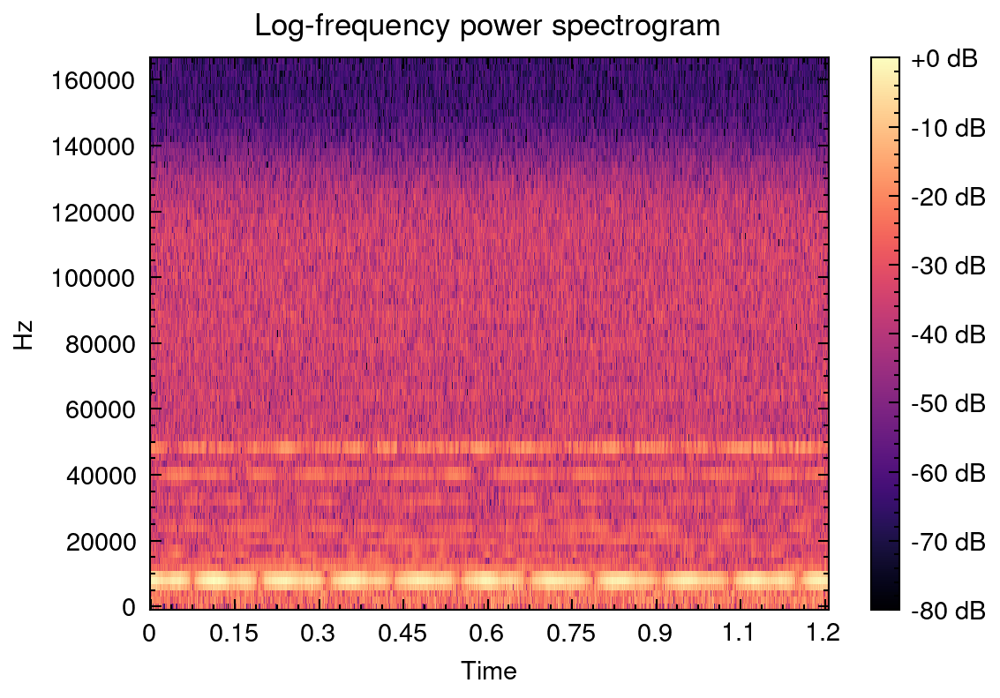

In [ ]:
for _i in tqdm(contextDF.index):
    tdms_mic  = TdmsFile(os.path.join(data_dir,_i,"AI_data.tdms"))
    mic_name = tdms_mic.properties['name']
    c = (tdms_mic.groups()[0]).channels()[0]
    mic = c.data
    mic = standardize_array(mic)
    print(f"{_i}\n Total process time:{mic.shape[0]/sampling_rate}s")
    frames = np.linspace(0, mic.shape[0]-roi_points, int(mic.shape[0]/sampling_rate*60),dtype=int,endpoint=True)

    def update(frame):
        data = mic[frame:frame+roi_points]
        spec = logSpectrogram(sampling_rate=sampling_rate,data=data,n_fft=n_fft,hop_length=hop_length,window_type=window_type,display=False)
        new_spec = spec[:int(spec.shape[0]/6),:]
        ratio = new_spec.shape[0]/spec.shape[0]
        librosa.display.specshow(new_spec, sr=sampling_rate*ratio, x_axis='time', y_axis='linear',hop_length=hop_length,fmax=fmax,fmin=fmin)


    fig,ax = plt.subplots(figsize=(10*centimeter, 7*centimeter))

    data = mic[start_i:start_i+roi_points]
    spec = logSpectrogram(sampling_rate=sampling_rate,data=data,n_fft=n_fft,hop_length=hop_length,window_type=window_type,display=False)
    new_spec = spec[:int(spec.shape[0]/6),:]
    ratio = new_spec.shape[0]/spec.shape[0]
    librosa.display.specshow(new_spec, sr=sampling_rate*ratio, x_axis='time', y_axis='linear',hop_length=hop_length,fmax=fmax,fmin=fmin)

    ax.set_title(f"Log-frequency power spectrogram")
    ax.set_xlabel("Time (s)")
    ax.set_ylabel("Frequency (Hz)")
    plt.colorbar(format='%+2.0f dB')

    ani = animation.FuncAnimation(fig=fig, func=update, frames=frames, interval=1000/60)

    plt.tight_layout()
    # plt.savefig(f"./outputs/{_i}_LogLinearSpec_Start{start_i}_ROI{roi_points}.png",dpi=300)
    ani.save(f'./outputs/{_i}_mic_LogLinear_ROI{roi_points}.gif', writer='ffmpeg',dpi=150)
    # plt.show()

## Slice the power on part out

In [ ]:
tdms_OPC  = TdmsFile(os.path.join(data_dir,contextDF.index[2],"OPC_UA_data.tdms"))
OPC_name = tdms_OPC.properties['name']
_power = (tdms_OPC.groups()[1]).channels()[0].data
print(f"Total process time:{_power.shape[0]/sampling_rate_opc}s")

tdms_mic  = TdmsFile(os.path.join(data_dir,contextDF.index[2],"AI_data.tdms"))
mic_name = tdms_mic.properties['name']
_mic = (tdms_mic.groups()[0]).channels()[0].data
print(f"Total process time:{_mic.shape[0]/sampling_rate}s")

Total process time:170.45s


Total process time:170.4s


In [ ]:
i_first_opc, i_last_opc = get_first_and_last_index_above_value(_power,1000)

# get the indices for the start and end point in mic data
i_first_mic:int = int(np.floor(i_first_opc/_power.shape[0]*_mic.shape[0]))
i_last_mic:int = int(np.floor(i_last_opc/_power.shape[0]*_mic.shape[0]))

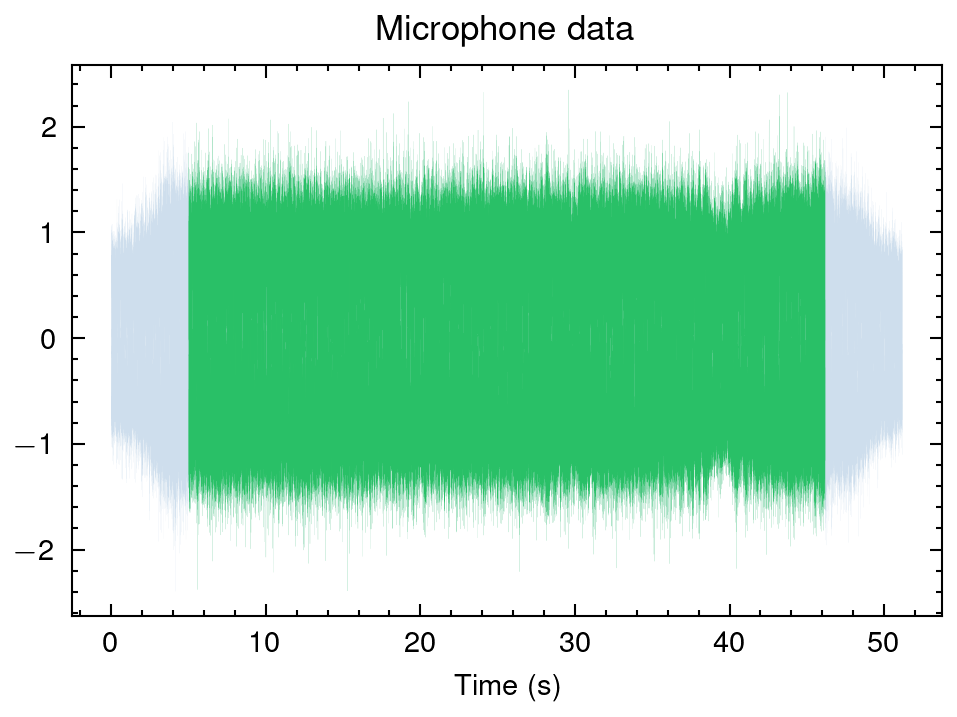

In [ ]:
margin = 5
_data1 = _mic[i_first_mic-margin*sampling_rate:i_last_mic+margin*sampling_rate]
_t1=np.linspace(0,_data1.shape[0]/sampling_rate,_data1.shape[0])
_data = _mic[i_first_mic:i_last_mic]
_t=np.linspace(margin,(_data.shape[0])/sampling_rate+margin,_data.shape[0])

fig,ax=plt.subplots()

ax.plot(_t1,_data1,lw=0.02,alpha=0.2,c=cm_std[0])
ax.plot(_t,_data,lw=0.02,alpha=0.8,c=cm_std[1])

ax.set_xlabel("Time (s)")
ax.set_title(f"Microphone data")
# ani = animation.FuncAnimation(fig=fig, func=update, frames=frames[:10], interval=1000/60)
plt.tight_layout()

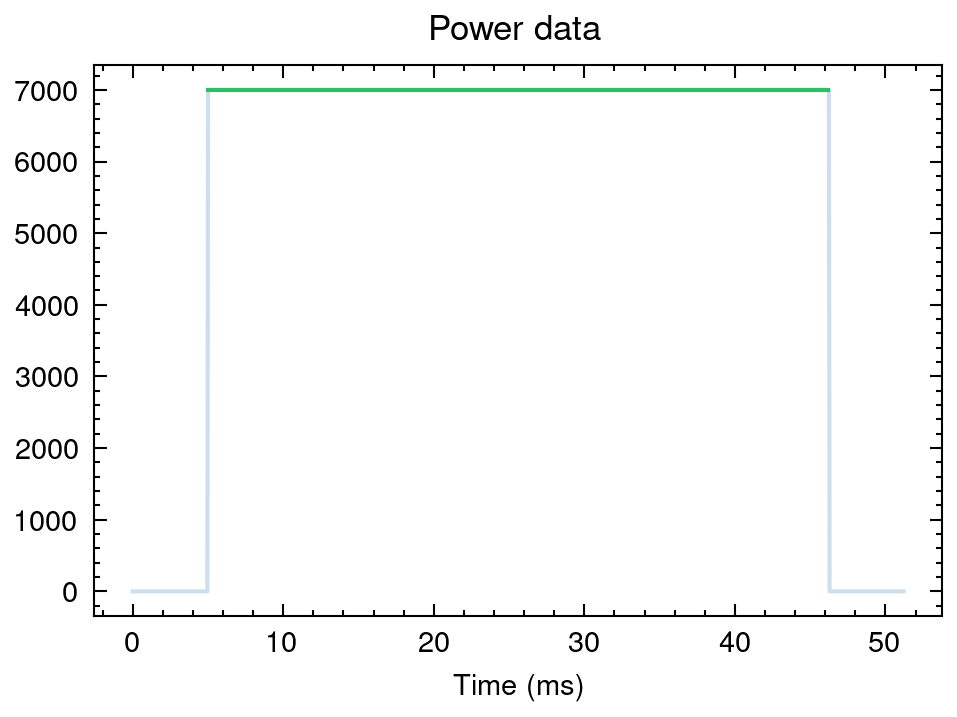

In [ ]:
_data1 = _power[i_first_opc-margin*sampling_rate_opc:i_last_opc+margin*sampling_rate_opc]
_t1=np.linspace(0,_data1.shape[0]/sampling_rate_opc,_data1.shape[0])
_data = _power[i_first_opc:i_last_opc]
_t=np.linspace(margin,(_data.shape[0])/sampling_rate_opc+margin,_data.shape[0])

fig,ax=plt.subplots()

ax.plot(_t1,_data1,lw=1,alpha=0.2,c=cm_std[0])
ax.plot(_t,_data,lw=1,alpha=0.8,c=cm_std[1])

ax.set_xlabel("Time (ms)")
ax.set_title(f"Power data")
# ani = animation.FuncAnimation(fig=fig, func=update, frames=frames[:10], interval=1000/60)
plt.tight_layout()

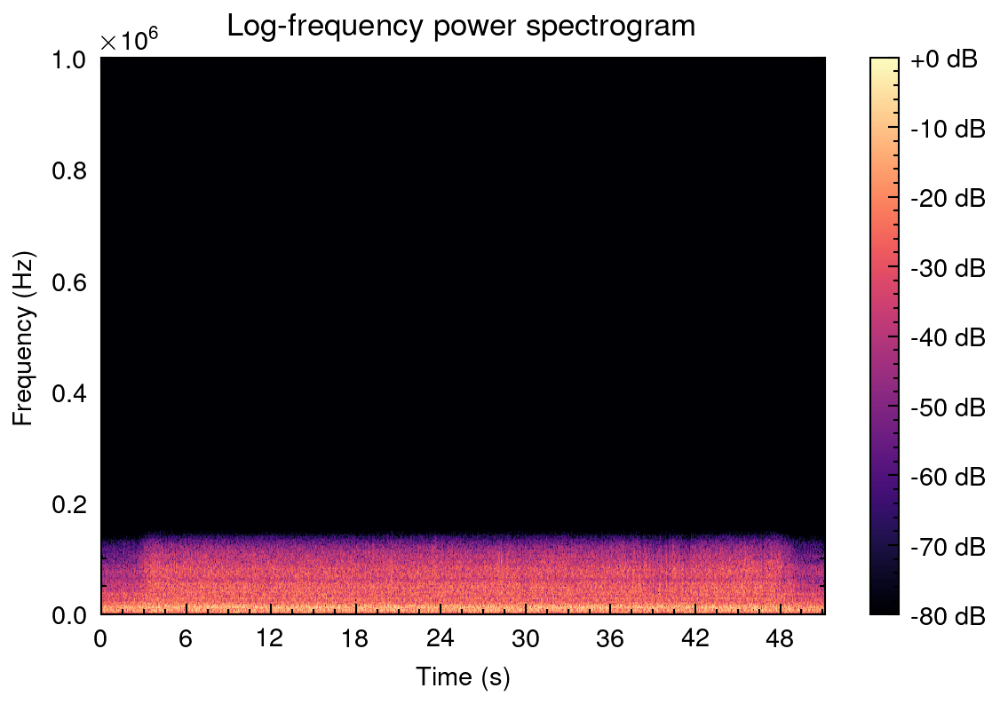

(513, 199953)


In [ ]:
n_fft=1024
hop_length=512
window_type ='hann'
mel_bins = 128
fmin=0
fmax=0.8*1e6
mel_power=2.0
_data1 = _mic[i_first_mic-margin*sampling_rate:i_last_mic+margin*sampling_rate]
spec = logSpectrogram(sampling_rate=sampling_rate,data=_data1,n_fft=n_fft,hop_length=hop_length,window_type=window_type,display=True)
print(spec.shape)

In [ ]:
standardize_dataframe_vertically(contextDF.iloc[:,:5])

,Laser power,Powder feed,Speed,Carrier,Shielding
test2,1.676043,0.428706,0.549704,0.849408,0.735077
test3,0.804501,0.428706,1.129121,0.849408,0.735077
test4,0.368729,0.428706,2.094817,0.849408,0.735077
test5,1.458157,0.428706,0.356565,-0.397304,-0.857589
test6,1.458157,0.175380,1.129121,0.849408,0.735077
test1,-0.720699,2.117545,0.356565,0.849408,0.735077
carrier1,-0.720699,0.428706,-0.802270,0.849408,0.735077
carrier2,-0.720699,0.175380,-0.802270,-0.397304,-0.857589
carrier3,-0.720699,0.428706,-0.802270,0.849408,0.735077
gas,-0.720699,-1.260134,-0.802270,-1.287812,0.735077


In [ ]:
onehot_encode_dataframe_vertically(contextDF.iloc[:,5:])

,Rod number_1.0,Rod number_2.0,Rod number_3.0,Exhaust on_0.0,Exhaust on_1.0
test2,True,False,False,False,True
test3,False,True,False,False,True
test4,False,True,False,False,True
test5,False,False,True,False,True
test6,False,False,True,False,True
test1,True,False,False,False,True
carrier1,False,False,True,False,True
carrier2,False,False,True,False,True
carrier3,False,False,True,False,True
gas,False,False,True,False,True
